In [89]:
import warnings
warnings.filterwarnings('ignore')
import operator
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error
import scipy
from scipy import stats
from statsmodels.stats.proportion import proportions_ztest
rng = np.random.default_rng()
import pip
import os
from tqdm.notebook import tqdm, trange
tqdm.pandas()
import seaborn as sns
sns.set_theme()
sns.set_style("whitegrid")
import matplotlib as mpl
import matplotlib.pyplot as plt
import folium
from folium import plugins
from pygam.pygam import LinearGAM, s, f, te, PoissonGAM
from scipy.stats import mannwhitneyu

pd.options.display.max_columns = None
pd.options.display.max_rows = None

<img src="https://raw.githubusercontent.com/outlawhayden/weather-crime/main/assets/katrina_radar.jpg" width="1600" height="200" />

# Investigating Relationship Between Weather and Criminal Offense Trends in New Orleans

### Hayden Outlaw, Joe Wagner | [Tulane CMPS 6790 Data Science](https://nmattei.github.io/cmps6790/) | Fall 2023

### https://outlawhayden.github.io/weather-crime




## Project Outline

In New Orleans, worse weather is conventionally understood to bring an increase in crime across the city. For example, [WDSU](https://www.youtube.com/watch?v=gF41X71PCMQ) reported on higher temperatures leading to higher murder rates, and there was a wide variety of crime that arose after [Hurricane Katrina](https://www.fbi.gov/history/famous-cases/hurricane-katrina-fraud). With specifically violent crime surging in recent years, officals are turning to every possible confounding factor for criminality, and there is a strong demand to understand the relationship between incidents of this kind and their causes.

The investigation between weather and criminal activity is almost as old as the concept of data-scientific investigations itself. Albert Quetelet posited a ["Thermic Law of Delinquency"](https://www.oxfordbibliographies.com/display/document/obo-9780195396607/obo-9780195396607-0130.xml) as far back as 1842, with criminologists probing the relationship between the two consistently ever since. Based on a survey by [Corcoran and Zahnow](https://crimesciencejournal.biomedcentral.com/articles/10.1186/s40163-022-00179-8), since 1842 and 2021, 200 studies on the topic have been published, predominantly in journal articles on criminology and psychology. From the same survey, 56.9% of the studies examined the weather-crime association in North America, and 42.8% of studies were on city-wide scales. 41.7% of these studies employ descriptive analysis, with 77.6% of them using multiple empirical elements followed by a modelling component. Within cities such as [Philadelphia](https://link.springer.com/article/10.1007/s11524-017-0181-y), [Dallas](https://psycnet.apa.org/doiLanding?doi=10.1037%2F0022-3514.78.6.1074), and [Baltimore](https://www.injuryjournal.com/article/S0020-1383(15)00418-0/fulltext), a clear relationship between weather and crime has been identified by research groups (specifically between temperature and violence), which points to the informal knowledge having a more rigorous backing that could extrapolate to the city of New Orleans.

A study by [Cohn](https://www.sciencedirect.com/science/article/abs/pii/S0272494405802166?via%3Dihub) in 1990 on the influence of weather and temporal variables on domestic violence outlines four key considerations for weather-crime research: theoretical grounding, operational measures of time and weather, temporal granularity, and statistical techniques. The vast majority of similar studies occur around the 1990s, with only a recent resurgence - given the widespread availability of big-data tools and data sources, it is now much easier to meet her proposed priorities for such a study than they were thirty years ago. Corcoran and Zahnow assert that many of these studies from this time do not successfully focus enough on these four criteria, and they also fail to control for things such as time of day, live weather at the time of the crime, or bias from imperfect data sources. 

No study of this kind exists for New Orleans, despite the city's uniquely strong concerns with regards to both crime rates and weather events. The majority of connections discovered surrounding weather and crime correlate temperature and violence, but also are most often found in northern cities with wider seasonal patterns that don't apply to New Orleans. Whether criminal activity in New Orleans contains a similar pattern, undiscovered patterns unique to the area, or no pattern at all, is yet to be determined. 
**With public data sources, we aim to investigate the relationship between weather trends and criminal activity from 2011 until the present. We will use the New Orleans Police Department service call records, alongside NOAA daily weather reports for various stations throughout the city, which we will load, extract, and parse.** With these data, there are a wide variety of questions that could be investigated, such as:
- Does the relationship between higher temperatures and violent crimes extend to New Orleans?
- Does the presence of weather affect criminal activities during it's ocurrence, or does it affect them in the future as well?
- Do individual weather events have as much of an effect on criminal activity as larger climate or seasonal trends?
- If a relationship between weather and crime exists, which parts of the city geographically does it affect most? Which portions are most insulated?

Below, we outline our collaboration plan, our data sources, and our initial extraction of some information.


## Collaboration Plan
To collaborate, we intend to utilize two primary tools. The first is a Github repository, which will handle code sharing, versioning control, organization, and publication. All of our code, tools, and assets are publicly available here: [GITHUB REPOSITORY](https://github.com/outlawhayden/weather-crime) 

For live programming collaboration, we intend to use [Visual Studio Code Live Share](https://code.visualstudio.com/learn/collaboration/live-share) which allows for live simultaneous code editing. We also intend to meet twice a week in person to commit to broader project planning and directional goals.

## New Orleans Police Department Calls for Service
-------
The first half of data that we require to investigate this relationship is crime data from New Orleans. [Data Driven NOLA](https://datadriven.nola.gov/home/) hosts publications of all New Orleans Police Department calls for service from 2011 to the present. The data is sanitized of any personal identifiers, but contains location, time, priority, and incident type information. Each year is hosted separately - and cumulatively, the dataset is too large for us to host. To download the data and run the notebook, the manual download sources are below:

- [2011 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2011/28ec-c8d6)
- [2012 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2012/rv3g-ypg7)
- [2013 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2013/5fn8-vtui)
- [2014 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2014/jsyu-nz5r)
- [2015 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2015/w68y-xmk6)
- [2016 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2016/wgrp-d3ma)
- [2017 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2017/bqmt-f3jk)
- [2018 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2018/9san-ivhk)
- [2019 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2019/qf6q-pp4b)
- [2020 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Call-for-Service-2020/hp7u-i9hf)
- [2021 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2021/3pha-hum9)
- [2022 Calls for Service](https://data.nola.gov/browse/?q=Calls%20for%20Service%202022&sortBy=relevance)
- [2023 Calls for Service](https://data.nola.gov/Public-Safety-and-Preparedness/Calls-for-Service-2023/pc5d-tvaw)

To download the data, go to Export -> CSV.

The following script takes all of the .csv files in the folder location `data_folder`, and stitches them together into one large dataframe to be cached as `calls_master.csv` and then loaded. To load the data, save all of the exported spreadsheets as .csv files into the location of `data_folder`, and then run the cell.

In [90]:
# location of data 
data_folder = '../data/calls_for_service'
# paths for all csv files in data_folder
csv_files = [f for f in os.listdir(data_folder) if f.endswith('csv')]
# if compiled csv file does not already exist
if 'calls_master.csv' not in csv_files:
    # make empty dataframe
    calls_for_service = pd.DataFrame()
    # combine all files in folder into one large dataframe
    for f in tqdm(csv_files, desc = "Combining Files"):
        file_path = os.path.join(data_folder, f)
        df = pd.read_csv(file_path)
        calls_for_service = pd.concat([calls_for_service, df], ignore_index = True)
    # export to combined csv file
    calls_for_service.to_csv('../data/calls_for_service/calls_master.csv')
else:
    # if compiled csv already exists, just load that
    calls_for_service = pd.read_csv(os.path.join(data_folder, 'calls_master.csv'))


In [91]:
calls_for_service.head()

,Unnamed: 0,NOPD_Item,Type,TypeText,Priority,InitialType,InitialTypeText,InitialPriority,MapX,MapY,TimeCreate,TimeDispatch,TimeArrive,TimeClosed,Disposition,DispositionText,SelfInitiated,Beat,BLOCK_ADDRESS,Zip,PoliceDistrict,Location,Type_,TimeArrival
0,0,A3472220,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3688756.0,528696.0,01/28/2020 01:37:20 AM,01/28/2020 01:37:20 AM,01/28/2020 01:37:28 AM,01/28/2020 02:25:50 AM,NAT,Necessary Action Taken,N,4G04,Atlantic Ave & Slidell St,70114.0,4,POINT (-90.04525645 29.94750953),NaN,NaN
1,1,A0000220,21,COMPLAINT OTHER,1J,21,COMPLAINT OTHER,1J,3668710.0,533007.0,01/01/2020 12:00:42 AM,01/01/2020 12:00:42 AM,01/01/2020 12:00:42 AM,01/01/2020 01:37:16 AM,NAT,Necessary Action Taken,Y,2U04,034XX Broadway St,70125.0,2,POINT (-90.10840522 29.95996774),NaN,NaN
2,2,A2190820,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3682445.0,530709.0,01/17/2020 09:18:41 PM,01/17/2020 09:18:41 PM,01/17/2020 09:18:47 PM,01/17/2020 09:18:54 PM,NAT,Necessary Action Taken,N,8B02,N Peters St & Bienville St,70130.0,8,POINT (-90.065113 29.95323762),NaN,NaN
3,3,A2874820,21,COMPLAINT OTHER,2A,21,COMPLAINT OTHER,1J,3737616.0,590067.0,01/23/2020 10:19:48 AM,01/23/2020 10:22:05 AM,01/23/2020 10:31:11 AM,01/23/2020 10:34:35 AM,GOA,GONE ON ARRIVAL,N,7L08,I-10 E,70129.0,7,POINT (-89.88854843 30.11465463),NaN,NaN
4,4,A2029120,34S,AGGRAVATED BATTERY BY SHOOTING,2C,34S,AGGRAVATED BATTERY BY SHOOTING,2C,3696210.0,551411.0,01/16/2020 05:09:05 PM,01/16/2020 05:09:43 PM,01/16/2020 05:16:07 PM,01/16/2020 10:49:37 PM,RTF,REPORT TO FOLLOW,N,7A01,Chef Menteur Hwy & Downman Rd,70126.0,7,POINT (-90.02090137 30.00973449),NaN,NaN


According to Data Driven NOLA, the default attributes are described as:
- **NOPD_Item**: The NOPD unique item number for the incident.
- **Type**: The NOPD Type associated with the call for service.
- **TypeText**: The NOPD TypeText associated with the call for service.
- **Priority**: The NOPD Priority associated with the call for service. Code 3 is considered the highest priority and is reserved for officer needs assistance. Code 2 are considered "emergency" calls for service. Code 1 are considered "non-emergency" calls for service. Code 0 calls do not require a police presence. Priorities are differentiated further using the letter designation with "A" being the highest priority within that level.
- **InitialType**: The NOPD InitialType associated with the call for service.
- **InitialTypeText**: The NOPD InitialTypeText associated with the call for service.
- **InitialPriority**: The NOPD InitialPriority associated with the call for service. See Priority description for more information.
- **MapX**: The NOPD MapX associated with the call for service. This is provided in state plane and obscured to protect the sensitivity of the data.
- **MapY**: The NOPD MapY associated with the call for service. This is provided in state plane and obscured to protect the sensitivity of the data.
- **TimeCreate**: The NOPD TimeCreate associated with the call for service. This is the time stamp of the create time of the incident in the CAD system.
- **TimeDispatch**: The NOPD TimeDispatch associated with the call for service. This is the entered time by OPCD or NOPD when an officer was dispatched. 
- **TimeArrive**: The NOPD TimeArrive associated with the call for service. This is the entered time by OPCD or NOPD when an officer arrived.
- **TimeClosed**: The NOPD TimeClosed associated with the call for service. This is the time stamp of the time the call was closed in the CAD system.
- **Disposition**: The NOPD Disposition associated with the call for service.
- **DispositionText**: The NOPD DispositionText associated with the call for service.
- **SelfInitiated**: The NOPD SelfInitiated associated with the call for service. A call is considered self-initiated if the Officer generates the item in the field as opposed to responding to a 911 call.
- **Beat**: The NOPD Beat associated with the call for service. This is the area within Orleans Parish that the call for service occurred. The first number is the NOPD District, the letter is the zone, and the numbers are the subzone.
- **BLOCK_ADDRESS**: The BLOCK unique address number for the incident. The block address has been obscured to protect the sensitivity of the data.
- **Zip**: The NOPD Zip associated with the call for service.
- **PoliceDistrict**: The NOPD PoliceDistrict associated with the call for service.
- **Location**: The NOPD Location associated with the call for service. The X,Y coordinates for the call for service obscured to protect the sensitivity of the data.


The dataset is large, with more than 5000000 rows.


In [92]:
calls_for_service.head()

,Unnamed: 0,NOPD_Item,Type,TypeText,Priority,InitialType,InitialTypeText,InitialPriority,MapX,MapY,TimeCreate,TimeDispatch,TimeArrive,TimeClosed,Disposition,DispositionText,SelfInitiated,Beat,BLOCK_ADDRESS,Zip,PoliceDistrict,Location,Type_,TimeArrival
0,0,A3472220,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3688756.0,528696.0,01/28/2020 01:37:20 AM,01/28/2020 01:37:20 AM,01/28/2020 01:37:28 AM,01/28/2020 02:25:50 AM,NAT,Necessary Action Taken,N,4G04,Atlantic Ave & Slidell St,70114.0,4,POINT (-90.04525645 29.94750953),NaN,NaN
1,1,A0000220,21,COMPLAINT OTHER,1J,21,COMPLAINT OTHER,1J,3668710.0,533007.0,01/01/2020 12:00:42 AM,01/01/2020 12:00:42 AM,01/01/2020 12:00:42 AM,01/01/2020 01:37:16 AM,NAT,Necessary Action Taken,Y,2U04,034XX Broadway St,70125.0,2,POINT (-90.10840522 29.95996774),NaN,NaN
2,2,A2190820,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3682445.0,530709.0,01/17/2020 09:18:41 PM,01/17/2020 09:18:41 PM,01/17/2020 09:18:47 PM,01/17/2020 09:18:54 PM,NAT,Necessary Action Taken,N,8B02,N Peters St & Bienville St,70130.0,8,POINT (-90.065113 29.95323762),NaN,NaN
3,3,A2874820,21,COMPLAINT OTHER,2A,21,COMPLAINT OTHER,1J,3737616.0,590067.0,01/23/2020 10:19:48 AM,01/23/2020 10:22:05 AM,01/23/2020 10:31:11 AM,01/23/2020 10:34:35 AM,GOA,GONE ON ARRIVAL,N,7L08,I-10 E,70129.0,7,POINT (-89.88854843 30.11465463),NaN,NaN
4,4,A2029120,34S,AGGRAVATED BATTERY BY SHOOTING,2C,34S,AGGRAVATED BATTERY BY SHOOTING,2C,3696210.0,551411.0,01/16/2020 05:09:05 PM,01/16/2020 05:09:43 PM,01/16/2020 05:16:07 PM,01/16/2020 10:49:37 PM,RTF,REPORT TO FOLLOW,N,7A01,Chef Menteur Hwy & Downman Rd,70126.0,7,POINT (-90.02090137 30.00973449),NaN,NaN


In [93]:
# size of calls_for_service
calls_for_service.shape

(5109233, 24)

By examining the `TypeText` attribute, we can see a few of the unique incident types reported in the dataset.

In [94]:
# list first 50 unique type labels for NOPD incidents
calls_for_service["TypeText"].unique()[:50]

array(['AREA CHECK', 'COMPLAINT OTHER', 'AGGRAVATED BATTERY BY SHOOTING',
       'AUTO ACCIDENT', 'RECOVERY OF REPORTED STOLEN VEHICLE',
       'DISTURBANCE (OTHER)', 'SHOPLIFTING', 'BICYCLE THEFT', 'HIT & RUN',
       'TRAFFIC STOP', 'BURGLAR ALARM, SILENT', 'DISCHARGING FIREARM',
       'SIMPLE BURGLARY VEHICLE', 'MEDICAL', 'SUSPICIOUS PERSON',
       'DOMESTIC DISTURBANCE', 'FIREWORKS', 'MENTAL PATIENT',
       'SUICIDE THREAT', 'PROWLER', 'FIGHT', 'THEFT',
       'SIMPLE CRIMINAL DAMAGE', 'EXTORTION (THREATS)', 'THEFT BY FRAUD',
       'SIMPLE BATTERY', 'RESIDENCE BURGLARY', 'HOMICIDE BY SHOOTING',
       'MISSING JUVENILE', 'RETURN FOR ADDITIONAL INFO',
       'UNAUTHORIZED USE OF VEHICLE', 'LOST PROPERTY',
       'VIOLATION OF PROTECTION ORDER', 'PUBLIC GATHERING',
       'AGGRAVATED RAPE', 'UNCLASSIFIED DEATH',
       'AGGRAVATED ASSAULT DOMESTIC', 'AUTO THEFT', 'TRAFFIC INCIDENT',
       'SIMPLE BATTERY DOMESTIC', 'DRUG VIOLATIONS',
       'SIMPLE ASSAULT DOMESTIC', 'THEFT FROM

### Cleaning Calls for Service Dataframe

Now that the NOPD data is loaded, it has to be cleaned slightly. First, we need to guarantee that the types of data are loaded correctly - let's examine what Pandas loaded for us, and see what needs to be changed.

In [95]:
# get all data types for calls_for_service
calls_for_service.dtypes

Unnamed: 0           int64
NOPD_Item           object
Type                object
TypeText            object
Priority            object
InitialType         object
InitialTypeText     object
InitialPriority     object
MapX               float64
MapY               float64
TimeCreate          object
TimeDispatch        object
TimeArrive          object
TimeClosed          object
Disposition         object
DispositionText     object
SelfInitiated       object
Beat                object
BLOCK_ADDRESS       object
Zip                float64
PoliceDistrict       int64
Location            object
Type_               object
TimeArrival         object
dtype: object

While most of the data categories are indeed objects, so the default setting worked correctly, there are a few categories we must change. We have to convert ZIP code to a categorical object (adding two zip codes doesn't make sense), as well as translating the time related attributes to [Pandas datetime objects](https://pandas.pydata.org/docs/reference/api/pandas.to_datetime.html).

In [96]:
# convert ZIP column to object
calls_for_service['Zip'] = calls_for_service['Zip'].astype(str)

In [97]:
# convert temporal attributes to datetime objects
calls_for_service['TimeCreate'] = pd.to_datetime(calls_for_service['TimeCreate'])
calls_for_service['TimeDispatch'] = pd.to_datetime(calls_for_service['TimeDispatch'])
calls_for_service['TimeArrive'] = pd.to_datetime(calls_for_service['TimeArrive'])
calls_for_service['TimeClosed'] = pd.to_datetime(calls_for_service['TimeClosed'])

We also have indices for each row that were created during data loading, so we make sure to drop the unneccessary column.

In [98]:
# drop junk index generated during reading
calls_for_service.drop(['Unnamed: 0'], axis =1, inplace = True)

### Location Extraction

Here, we must extract the proper locations of each service call. This will allow us to match them to the proper weather station in the NOAA dataframe. Eventually, we will use these coordinates to break our incidents up into a grid for our model.

In [99]:
calls_for_service[["Longitude", "Latitude"]] = calls_for_service["Location"].str.extract(r'POINT \((-?\d+\.\d+) (-?\d+\.\d+)\)')

The values initially get parsed into strings, so we set them as floats.

In [100]:
calls_for_service["Longitude"] = calls_for_service["Longitude"].astype(float)
calls_for_service["Latitude"] = calls_for_service["Latitude"].astype(float)

In [101]:
calls_for_service.head()

,NOPD_Item,Type,TypeText,Priority,InitialType,InitialTypeText,InitialPriority,MapX,MapY,TimeCreate,TimeDispatch,TimeArrive,TimeClosed,Disposition,DispositionText,SelfInitiated,Beat,BLOCK_ADDRESS,Zip,PoliceDistrict,Location,Type_,TimeArrival,Longitude,Latitude
0,A3472220,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3688756.0,528696.0,2020-01-28 01:37:20,2020-01-28 01:37:20,2020-01-28 01:37:28,2020-01-28 02:25:50,NAT,Necessary Action Taken,N,4G04,Atlantic Ave & Slidell St,70114.0,4,POINT (-90.04525645 29.94750953),NaN,NaN,-90.045256,29.947510
1,A0000220,21,COMPLAINT OTHER,1J,21,COMPLAINT OTHER,1J,3668710.0,533007.0,2020-01-01 00:00:42,2020-01-01 00:00:42,2020-01-01 00:00:42,2020-01-01 01:37:16,NAT,Necessary Action Taken,Y,2U04,034XX Broadway St,70125.0,2,POINT (-90.10840522 29.95996774),NaN,NaN,-90.108405,29.959968
2,A2190820,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3682445.0,530709.0,2020-01-17 21:18:41,2020-01-17 21:18:41,2020-01-17 21:18:47,2020-01-17 21:18:54,NAT,Necessary Action Taken,N,8B02,N Peters St & Bienville St,70130.0,8,POINT (-90.065113 29.95323762),NaN,NaN,-90.065113,29.953238
3,A2874820,21,COMPLAINT OTHER,2A,21,COMPLAINT OTHER,1J,3737616.0,590067.0,2020-01-23 10:19:48,2020-01-23 10:22:05,2020-01-23 10:31:11,2020-01-23 10:34:35,GOA,GONE ON ARRIVAL,N,7L08,I-10 E,70129.0,7,POINT (-89.88854843 30.11465463),NaN,NaN,-89.888548,30.114655
4,A2029120,34S,AGGRAVATED BATTERY BY SHOOTING,2C,34S,AGGRAVATED BATTERY BY SHOOTING,2C,3696210.0,551411.0,2020-01-16 17:09:05,2020-01-16 17:09:43,2020-01-16 17:16:07,2020-01-16 22:49:37,RTF,REPORT TO FOLLOW,N,7A01,Chef Menteur Hwy & Downman Rd,70126.0,7,POINT (-90.02090137 30.00973449),NaN,NaN,-90.020901,30.009734


### Getting Rid of Duplicates and False Calls

Obviously not every call to the police turns up a crime or results in any action. Therefore, it is important we do our best to drop all the unrepresentative calls. Let's take a look at the DispositionText column which informs us the results of each call and the Disposition column which is the abbreviatied version of the previous column.

In [102]:
calls_for_service["DispositionText"].value_counts()

DispositionText
Necessary Action Taken                2511179
REPORT TO FOLLOW                       979928
GONE ON ARRIVAL                        549778
NECESSARY ACTION TAKEN                 527679
VOID                                   236148
UNFOUNDED                              167989
DUPLICATE                              134592
MUNICIPAL NECESSARY ACTION TAK            422
Test incident                             253
Test Incident                             233
Canceled By Complainant                   226
REFERRED TO EXTERNAL AGENCY               185
RTA Related Incident Disposition          130
TRUANCY NECESSARY ACTION TAKEN            129
FALSE ALARM                               100
UNKNOWN                                    81
Clear                                      46
SUPPLEMENTAL                               28
Sobering Center Transport                  28
CURFEW NECESSARY ACTION TAKEN               6
REPORT TO FOLLOW MUNICIPAL                  4
REPORT TO FOLLOW C

In [103]:
calls_for_service["Disposition"].value_counts()

Disposition
NAT      3038859
RTF       979928
GOA       549777
VOI       236148
UNF       167989
DUP       134592
NATM         422
EST          253
TST          233
CBC          226
REF          185
TRN          130
NATT         129
FAR          100
NO911         50
-13           43
SBC           28
SUPP          28
FDINF         17
NODIS         12
NATC           6
RTFC           4
RTFM           4
CLR            3
TEST           3
RTFT           2
MD/PM          1
1              1
NAT67          1
NAT18          1
NAT71          1
OFFLN          1
RUF            1
Name: count, dtype: int64

The two columns represent the same text, but the DispositionText column is more specific and will be easier to work with. Let's now remove any duplicate, void, or false alarm calls along with any where the subject was gone on arrival utilizing the DispositionText. While it might seem intuitive to instantly remove "unfounded" calls, they represent a call where a charge was not given, but an incident still took place - as such, we leave them in our dataset.

In [104]:
disposition_mask = "GONE ON ARRIVAL|VOID|FALSE ALARM|Clear|DUPLICATE|Test incident|Test Incident|Canceled By Complainant"
calls_for_service = calls_for_service[calls_for_service["DispositionText"].str.contains(disposition_mask)==False]

Successful, as seen below by our new counts for each crime disposition.

In [105]:
calls_for_service["DispositionText"].value_counts()

DispositionText
Necessary Action Taken                2511179
REPORT TO FOLLOW                       979928
NECESSARY ACTION TAKEN                 527679
UNFOUNDED                              167989
MUNICIPAL NECESSARY ACTION TAK            422
REFERRED TO EXTERNAL AGENCY               185
RTA Related Incident Disposition          130
TRUANCY NECESSARY ACTION TAKEN            129
UNKNOWN                                    81
SUPPLEMENTAL                               28
Sobering Center Transport                  28
CURFEW NECESSARY ACTION TAKEN               6
REPORT TO FOLLOW MUNICIPAL                  4
REPORT TO FOLLOW CURFEW                     4
TEST MOTOROLA                               3
REPORT TO FOLLOW TRUANCY                    2
Report written incident UnFounded           1
CREATED ON SYS DOWN/RESEARCH                1
Name: count, dtype: int64

### Categorizing Call Types

The NOPD labels activity with a short string. However, there are 430 different labels, some of which are more specific than others. They also contain typos, multiple labels for the same concept, and events that are not of interest. 

In [106]:
calls_for_service["TypeText"].unique().shape[0]

430

In [107]:
calls_for_service["TypeText"][0:10]

0                              AREA CHECK
1                         COMPLAINT OTHER
2                              AREA CHECK
4          AGGRAVATED BATTERY BY SHOOTING
5                           AUTO ACCIDENT
6     RECOVERY OF REPORTED STOLEN VEHICLE
10                              HIT & RUN
11                           TRAFFIC STOP
13                             AREA CHECK
15                             AREA CHECK
Name: TypeText, dtype: object

To simplify, we are going to create 19 different bins based on similar sudies, and add each category into one of these bins. 

0. Accidents/Traffic Safety
1. Alarms
2. Public Assistance
3. Mental Health
4. Complaints/Environment
5. Domestic Violence
6. Drugs
7. Fire
8. Alcohol
9. Medical Emergencies
10. Missing Persons
11. Officer Needs Help
12. Not Crime
13. Other
14. Property
15. Sex Offenses
16. Status
17. Suspicion
18. Violent Crime
19. Warrants

In [108]:
types = ['Accidents/Traffic Safety', 'Alarms', 'Public Assistance', 'Mental Health', 'Complaints/Environment', 'Domestic Violence',
        'Drugs','Fire','Alcohol','Medical Emergencies','Missing Persons','Officer Needs Help', 'Not Crime', 'Other', 'Property',
        'Sex Offenses', 'Status','Suspicion','Violent Crime','Warrants']

The mapping are contained in an excel file, where we mapped each crime's TypeText feature to one of 20 specific categories above. We can load this in from an excel file to a spreadsheet, and then use it as a map to create the broader categories. 

In [109]:
file_path = '../data/output_data.xlsx'
mapping_df = pd.read_excel(file_path)

mapping_dict = mapping_df.set_index('TypeText')['Index'].to_dict()

In [110]:
calls_for_service.head()

,NOPD_Item,Type,TypeText,Priority,InitialType,InitialTypeText,InitialPriority,MapX,MapY,TimeCreate,TimeDispatch,TimeArrive,TimeClosed,Disposition,DispositionText,SelfInitiated,Beat,BLOCK_ADDRESS,Zip,PoliceDistrict,Location,Type_,TimeArrival,Longitude,Latitude
0,A3472220,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3688756.0,528696.0,2020-01-28 01:37:20,2020-01-28 01:37:20,2020-01-28 01:37:28,2020-01-28 02:25:50,NAT,Necessary Action Taken,N,4G04,Atlantic Ave & Slidell St,70114.0,4,POINT (-90.04525645 29.94750953),NaN,NaN,-90.045256,29.947510
1,A0000220,21,COMPLAINT OTHER,1J,21,COMPLAINT OTHER,1J,3668710.0,533007.0,2020-01-01 00:00:42,2020-01-01 00:00:42,2020-01-01 00:00:42,2020-01-01 01:37:16,NAT,Necessary Action Taken,Y,2U04,034XX Broadway St,70125.0,2,POINT (-90.10840522 29.95996774),NaN,NaN,-90.108405,29.959968
2,A2190820,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3682445.0,530709.0,2020-01-17 21:18:41,2020-01-17 21:18:41,2020-01-17 21:18:47,2020-01-17 21:18:54,NAT,Necessary Action Taken,N,8B02,N Peters St & Bienville St,70130.0,8,POINT (-90.065113 29.95323762),NaN,NaN,-90.065113,29.953238
4,A2029120,34S,AGGRAVATED BATTERY BY SHOOTING,2C,34S,AGGRAVATED BATTERY BY SHOOTING,2C,3696210.0,551411.0,2020-01-16 17:09:05,2020-01-16 17:09:43,2020-01-16 17:16:07,2020-01-16 22:49:37,RTF,REPORT TO FOLLOW,N,7A01,Chef Menteur Hwy & Downman Rd,70126.0,7,POINT (-90.02090137 30.00973449),NaN,NaN,-90.020901,30.009734
5,A3444420,20,AUTO ACCIDENT,1E,20,AUTO ACCIDENT,1E,3666298.0,529693.0,2020-01-27 19:59:59,2020-01-27 20:02:05,2020-01-27 20:14:58,2020-01-27 21:19:56,RTF,REPORT TO FOLLOW,N,2L04,Broadway St & S Claiborne Ave,70125.0,2,POINT (-90.11613127 29.95092657),NaN,NaN,-90.116131,29.950927


The **SimpleType** attribute now contains our categorizations of each crime. These will play a persistent role throughout our EDA and model.

In [111]:
calls_for_service["SimpleType"] = calls_for_service['TypeText'].progress_apply(lambda x: types[mapping_dict[x]])

calls_for_service.head()

print(calls_for_service.iloc[352]["SimpleType"])


  0%|          | 0/4187799 [00:00<?, ?it/s]

Status


## NOAA Weather Station Data
-------
The second data requirement to answer this question is weather data from around New Orleans across time. The National Oceanic and Atmospheric Administration maintains the [Climate Data Online Service](https://www.ncei.noaa.gov/access/search/index), which allows for requests of historical data from federal weather stations across the country. Our target dataset is the Global Historical Cliamte Network Daily, which includes daily land surface observations around the world of temperature, precipitation, wind speed, and other attributes. While there is no direct way to immediately download the data from NOAA, they do allow for public requests via email which include a source from which to download the results of the query. Fortunately, since the data is formatted in a low memory fashion, the dataset is small enough for us to host for this project publicly and allow us to sidestep the request requirement while remaining inside the NOAA terms of service. To download the data specific to this project, they are available as a part of this project's repository [HERE](https://github.com/outlawhayden/weather-crime/blob/main/data/weather/NCEI_CDO.csv).

To make your own data request, one can be filed [HERE](https://www.ncei.noaa.gov/access/search/index).

![GHCN-Daily Query](https://raw.githubusercontent.com/outlawhayden/weather-crime/main/assets/NCEI_Reciept.png)

For this project, there are 11 different weather stations with archived data from Jan 1 2011 to the date of the query (Sept 29 2023). 

![GHCN-Station Maps](https://raw.githubusercontent.com/outlawhayden/weather-crime/main/assets/NCIS_map.png)

Some of the stations are renamings of existing stations, so there are eight unique locations that the weather data comes from. With this information, given a crime location and time, we can match it to the weather data from the nearest station with data at that point geographically, and establish what the weather was when it occurred.



In [112]:
# read in weather data
weather = pd.read_csv('../data/weather/NCEI_CDO.csv', low_memory = False)

### Cleaning Weather Dataframe

In [113]:
weather.head()

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,AWND,AWND_ATTRIBUTES,DAPR,DAPR_ATTRIBUTES,FMTM,FMTM_ATTRIBUTES,MDPR,MDPR_ATTRIBUTES,PGTM,PGTM_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNOW,SNOW_ATTRIBUTES,SNWD,SNWD_ATTRIBUTES,TAVG,TAVG_ATTRIBUTES,TMAX,TMAX_ATTRIBUTES,TMIN,TMIN_ATTRIBUTES,TOBS,TOBS_ATTRIBUTES,WDF2,WDF2_ATTRIBUTES,WDF5,WDF5_ATTRIBUTES,WSF2,WSF2_ATTRIBUTES,WSF5,WSF5_ATTRIBUTES,WT01,WT01_ATTRIBUTES,WT02,WT02_ATTRIBUTES,WT03,WT03_ATTRIBUTES,WT04,WT04_ATTRIBUTES,WT05,WT05_ATTRIBUTES,WT06,WT06_ATTRIBUTES,WT08,WT08_ATTRIBUTES,WT10,WT10_ATTRIBUTES,WT11,WT11_ATTRIBUTES,WT13,WT13_ATTRIBUTES,WT14,WT14_ATTRIBUTES,WT16,WT16_ATTRIBUTES,WT18,WT18_ATTRIBUTES,WT21,WT21_ATTRIBUTES
0,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.03,",,N",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.04,",,N",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,"T,,N",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.50,",,N",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.59,",,N",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [114]:
station_list = weather["STATION"].unique()
station_list

array(['US1LAOR0006', 'US1LAOR0016', 'USW00012916', 'US1LAOR0003',
       'US1LAOR0014', 'USC00166666', 'US1LAOR0012', 'USW00053917',
       'USW00012930', 'US1LAOR0009', 'US1LAOR0019'], dtype=object)

In [115]:
weather.columns

Index(['STATION', 'NAME', 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'DATE', 'AWND',
       'AWND_ATTRIBUTES', 'DAPR', 'DAPR_ATTRIBUTES', 'FMTM', 'FMTM_ATTRIBUTES',
       'MDPR', 'MDPR_ATTRIBUTES', 'PGTM', 'PGTM_ATTRIBUTES', 'PRCP',
       'PRCP_ATTRIBUTES', 'SNOW', 'SNOW_ATTRIBUTES', 'SNWD', 'SNWD_ATTRIBUTES',
       'TAVG', 'TAVG_ATTRIBUTES', 'TMAX', 'TMAX_ATTRIBUTES', 'TMIN',
       'TMIN_ATTRIBUTES', 'TOBS', 'TOBS_ATTRIBUTES', 'WDF2', 'WDF2_ATTRIBUTES',
       'WDF5', 'WDF5_ATTRIBUTES', 'WSF2', 'WSF2_ATTRIBUTES', 'WSF5',
       'WSF5_ATTRIBUTES', 'WT01', 'WT01_ATTRIBUTES', 'WT02', 'WT02_ATTRIBUTES',
       'WT03', 'WT03_ATTRIBUTES', 'WT04', 'WT04_ATTRIBUTES', 'WT05',
       'WT05_ATTRIBUTES', 'WT06', 'WT06_ATTRIBUTES', 'WT08', 'WT08_ATTRIBUTES',
       'WT10', 'WT10_ATTRIBUTES', 'WT11', 'WT11_ATTRIBUTES', 'WT13',
       'WT13_ATTRIBUTES', 'WT14', 'WT14_ATTRIBUTES', 'WT16', 'WT16_ATTRIBUTES',
       'WT18', 'WT18_ATTRIBUTES', 'WT21', 'WT21_ATTRIBUTES'],
      dtype='object')

In [116]:
special_attribute_labels = {"WT01":"Fog","WT02":"Heavy Fog","WT03":"Thunder","WT04":"Ice Pellets", "WT05":"Hail", "WT06":"Rime", 
                            "WT07": "Dust", "WT08":"Smoke", "WT09":"Blowing Snow", "WT10":"Tornado", "WT11":"High Wind", "WT12":"Blowing Spray",
                            "WT13":"Mist", "WT14":"Drizzle", "WT15":"Freezing Drizzle", "WT16":"Rain", "WT17":"Freezing Rain", "WT18":"Snow", "WT19":"Unknown Precipitation",
                           "WT21":"Ground Fog", "WT22":"Ice Fog"}


for col in special_attribute_labels:
    if col in weather.columns:
        weather[col] = weather[col].notnull()
    attribute = col + "_ATTRIBUTES"
    if attribute in weather.columns:
        weather.drop(attribute, inplace = True, axis = 1)

weather.rename(columns = special_attribute_labels, inplace = True)

In [117]:
weather.iloc[[2716]]

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,AWND,AWND_ATTRIBUTES,DAPR,DAPR_ATTRIBUTES,FMTM,FMTM_ATTRIBUTES,MDPR,MDPR_ATTRIBUTES,PGTM,PGTM_ATTRIBUTES,PRCP,PRCP_ATTRIBUTES,SNOW,SNOW_ATTRIBUTES,SNWD,SNWD_ATTRIBUTES,TAVG,TAVG_ATTRIBUTES,TMAX,TMAX_ATTRIBUTES,TMIN,TMIN_ATTRIBUTES,TOBS,TOBS_ATTRIBUTES,WDF2,WDF2_ATTRIBUTES,WDF5,WDF5_ATTRIBUTES,WSF2,WSF2_ATTRIBUTES,WSF5,WSF5_ATTRIBUTES,Fog,Heavy Fog,Thunder,Ice Pellets,Hail,Rime,Smoke,Tornado,High Wind,Mist,Drizzle,Rain,Snow,Ground Fog
2716,USW00012916,"NEW ORLEANS AIRPORT, LA US",29.99755,-90.27772,-1.0,2011-01-18,6.93,",,W",NaN,NaN,1733.0,",,X",NaN,NaN,1732.0,",,W",0.95,",,X,2400",NaN,NaN,NaN,NaN,NaN,NaN,73.0,",,X",45.0,",,X",NaN,NaN,290.0,",,X",290.0,",,X",29.1,",,X",38.9,",,X",True,True,True,False,False,False,True,False,False,False,False,True,False,False


In [118]:
weather["DATE"] = pd.to_datetime(weather["DATE"])

In [119]:
general_attribute_labels = {"AWND":"AverageDailyWind", "DAPR":"NumDaysPrecipAvg", "FMTM":"FastestWindTime",
                      "MDPR":"MultidayPrecipTotal", "PGTM":"PeakGustTime", "PRCP":"Precipitation", "SNOW":"Snowfall",
                      "SNWD":"MinSoilTemp", "TAVG":"TimeAvgTemp", "TMAX":"TimeMaxTemp", "TMIN":"TimeMinTemp","TOBS":"TempAtObs", "WDF2":"2MinMaxWindDirection",
                      "WDF5":"5MinMaxWindDirection", "WSF2":"2MinMaxWindSpeed", "WSF5":"5MinMaxWindSpeed"}
                 
                      
for c, col in enumerate(general_attribute_labels):
    attribute = col + "_ATTRIBUTES"
    if attribute in weather.columns:
        weather.drop(attribute, inplace = True, axis = 1)
        
weather.rename(columns = general_attribute_labels, inplace = True)
    
    
decapitalize = {"STATION":"Station", "NAME":"Name", "LATITUDE":"Latitude", "LONGITUDE":"Longitude", "ELEVATION":"Elevation", "DATE":"Date"}

weather.rename(columns = decapitalize, inplace = True)

weather.head()

,Station,Name,Latitude,Longitude,Elevation,Date,AverageDailyWind,NumDaysPrecipAvg,FastestWindTime,MultidayPrecipTotal,PeakGustTime,Precipitation,Snowfall,MinSoilTemp,TimeAvgTemp,TimeMaxTemp,TimeMinTemp,TempAtObs,2MinMaxWindDirection,5MinMaxWindDirection,2MinMaxWindSpeed,5MinMaxWindSpeed,Fog,Heavy Fog,Thunder,Ice Pellets,Hail,Rime,Smoke,Tornado,High Wind,Mist,Drizzle,Rain,Snow,Ground Fog
0,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-01,NaN,NaN,NaN,NaN,NaN,0.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-02,NaN,NaN,NaN,NaN,NaN,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-03,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-04,NaN,NaN,NaN,NaN,NaN,0.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,2015-02-05,NaN,NaN,NaN,NaN,NaN,0.59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [120]:
weather.set_index(["Date", "Station"], inplace = True)
weather.sort_index(ascending = False, inplace = True)

weather.head()

Name  Latitude  \
Date       Station                                                       
2023-09-29 USW00012930            NEW ORLEANS AUDUBON, LA US  29.91660   
           USW00012916            NEW ORLEANS AIRPORT, LA US  29.99755   
           US1LAOR0014            NEW ORLEANS 3.8 WSW, LA US  29.93772   
           US1LAOR0009              NEW ORLEANS 5.0 N, LA US  30.01515   
2023-09-28 USW00053917  NEW ORLEANS LAKEFRONT AIRPORT, LA US  30.04934   

                        Longitude  Elevation  AverageDailyWind  \
Date       Station                                               
2023-09-29 USW00012930 -90.130200        6.1               NaN   
           USW00012916 -90.277720       -1.0               NaN   
           US1LAOR0014 -90.131310        2.1               NaN   
           US1LAOR0009 -90.065586        0.6               NaN   
2023-09-28 USW00053917 -90.028990        0.9             15.43   

                        NumDaysPrecipAvg  FastestWindTime  \
Date       Station                                          
2023-09-29 USW00012930               NaN              NaN   
           USW00012916               NaN              NaN   
           US1LAOR0014               NaN              NaN   
           US1LAOR0009               NaN              NaN   
2023-09-28 USW00053917               NaN              NaN   

                        MultidayPrecipTotal  PeakGustTime  Precipitation  \
Date       Station                                                         
2023-09-29 USW00012930                  NaN           NaN            0.0   
           USW00012916                  NaN           NaN            NaN   
           US1LAOR0014                  NaN           NaN            0.0   
           US1LAOR0009                  NaN           NaN            0.0   
2023-09-28 USW00053917                  NaN        1815.0            0.0   

                        Snowfall  MinSoilTemp  TimeAvgTemp  TimeMaxTemp  \
Date       Station                                                        
2023-09-29 USW00012930       NaN          NaN          NaN         85.0   
           USW00012916       NaN          NaN         78.0          NaN   
           US1LAOR0014       0.0          NaN          NaN          NaN   
           US1LAOR0009       0.0          NaN          NaN          NaN   
2023-09-28 USW00053917       NaN          NaN          NaN         87.0   

                        TimeMinTemp  TempAtObs  2MinMaxWindDirection  \
Date       Station                                                     
2023-09-29 USW00012930         73.0       73.0                   NaN   
           USW00012916          NaN        NaN                   NaN   
           US1LAOR0014          NaN        NaN                   NaN   
           US1LAOR0009          NaN        NaN                   NaN   
2023-09-28 USW00053917         77.0        NaN                  60.0   

                        5MinMaxWindDirection  2MinMaxWindSpeed  \
Date       Station                                               
2023-09-29 USW00012930                   NaN               NaN   
           USW00012916                   NaN               NaN   
           US1LAOR0014                   NaN               NaN   
           US1LAOR0009                   NaN               NaN   
2023-09-28 USW00053917                  90.0              21.9   

                        5MinMaxWindSpeed    Fog  Heavy Fog  Thunder  \
Date       Station                                                    
2023-09-29 USW00012930               NaN  False      False    False   
           USW00012916               NaN  False      False    False   
           US1LAOR0014               NaN  False      False    False   
           US1LAOR0009               NaN  False      False    False   
2023-09-28 USW00053917              25.9  False      False    False   

                        Ice Pellets   Hail   Rime  Smoke  Tornado  High Wind  \
Date       Station                       

## EDA

Let's take a look at some firework related 911 calls. Before plotting, we would expect there to be an influx on certain days of the year (NYE, July 4). We can extract just the type of offense, and the time from the master dataframe.

In [121]:
# create copy of dataframe type and time columns, and select only ones where the type includes FIRE BOMB, EXPLOSION, FIREWORKS, or ILLEGAL FIREWORKS
explosions_df = calls_for_service[["TypeText", "TimeCreate"]].copy()[calls_for_service["TypeText"].str.contains('FIRE BOMB|EXPLOSION|FIREWORKS|ILLEGAL FIREWORKS')]

In [122]:
# get the number of each of these kind of incidents overall
explosions_df["TypeText"].value_counts()

TypeText
FIREWORKS            3290
ILLEGAL FIREWORKS      87
EXPLOSION              14
FIRE BOMB               1
Name: count, dtype: int64

From this data, 5249 incdents involved fireworks, 169 involved illegal fireworks, 42 involved explosions, and 1 involved a fire bomb. However, we want to see how many of each kind of incident occur on each day and month, independent of the time, or the year. We can do this by extracting just the month and day of the incident from the datetime object. 

In [123]:
# extract just the month and day from each incident
explosions_df["Date"] = explosions_df["TimeCreate"].dt.strftime('%m-%d')
explosions_df.head()

,TypeText,TimeCreate,Date
26,FIREWORKS,2020-01-01 00:00:34,01-01
27,FIREWORKS,2020-01-01 00:01:05,01-01
2502,FIREWORKS,2020-01-01 00:03:46,01-01
2503,FIREWORKS,2020-01-01 00:03:52,01-01
4494,FIREWORKS,2020-04-20 20:22:27,04-20


Since we care about the date, the type of incident, and the quantity of ocurrence, let's group the data by the date of occurrence and then within by the type of incident. We can reindex by these two attributes and then examine their relationship to the quantity.

In [124]:
# reindex over date, and then the kind of incident within
explosions_nested_df = pd.DataFrame(explosions_df.groupby(["Date", "TypeText"])["TypeText"].count())
explosions_nested_df.rename(columns = {"Date" : "Date", "TypeText": "TypeText", "TypeText": "Quantity"}, inplace = True)
explosions_nested_df.head()

Quantity
Date  TypeText                   
01-01 FIREWORKS               460
      ILLEGAL FIREWORKS        15
01-02 FIREWORKS                48
      ILLEGAL FIREWORKS         1
01-03 FIREWORKS                25

Which day had the most incidents?

In [125]:
print("Maximum Incidents on", explosions_nested_df["Quantity"].idxmax()[0])
print("Maximum Number of Incidents is", explosions_nested_df["Quantity"].max())

Maximum Incidents on 07-04
Maximum Number of Incidents is 726


Unsuprisingly, the most occur on the Fourth of July, which lines up with our expectations. Let's make a plot to examine the frequency of explosive incedents throughout the year, and see if there are other patterns to be seen.

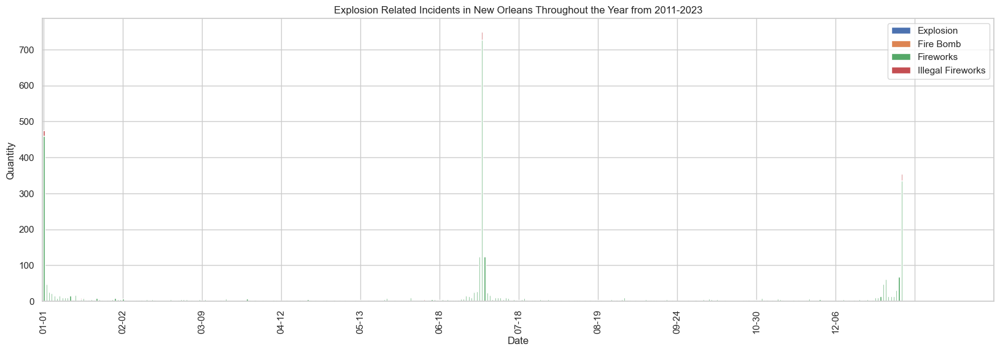

In [126]:
# create stacked bar plot of each kind of explosion-related incident for each day during the year over all of the data
ax = explosions_nested_df.unstack().plot(kind = "bar", stacked = True, figsize = (20,6))
xtick_interval = 30
ax.set_xticks(range(0, 365, xtick_interval));
ax.set_ylabel("Quantity")
ax.set_title("Explosion Related Incidents in New Orleans Throughout the Year from 2011-2023")
ax.legend(["Explosion", "Fire Bomb", "Fireworks", "Illegal Fireworks"]);

While there is a dramatic spike around the fourth of July, there is also noticeable additional activity around Christmas and New Years. Other than that, explosion related incedents are relatively rare throughout the rest of the year. While this pattern of activity is seasonal and shows a clear temporal pattern, it can be explained by the incidence of holidays much better than climate patterns thoughout the year.

Let's now examine incidents that have a direct causal relationship with the weather. We can query from the incident reports in a similar way any incidents that contain the word "FLOOD" in the label.

In [127]:
# get all incidents that mention 'FLOOD'
floods_df = calls_for_service[["TypeText", "TimeCreate"]].copy()[calls_for_service["TypeText"].str.contains('FLOOD')]
floods_df["TypeText"].value_counts()

TypeText
FLOOD EVENT                     2898
FLOODED STREET                   121
FLOODED VEHICLE                   35
FLOODED VEHICLE (NOT MOVING)       1
Name: count, dtype: int64

There were 3231 flood related events, with 135 flooded streets, and 71 flooded vehicles. We can extract the date and month of each event, and get the quantity for each day in all years in the same way that we did for the explosion data.

In [128]:
# extract month, day from datetime objects
floods_df["Date"] = floods_df["TimeCreate"].dt.strftime('%m-%d')
floods_df.head()

,TypeText,TimeCreate,Date
14553,FLOOD EVENT,2020-05-23 21:26:31,05-23
35718,FLOOD EVENT,2020-05-15 00:45:38,05-15
35725,FLOOD EVENT,2020-05-15 00:49:22,05-15
35744,FLOOD EVENT,2020-05-15 01:08:16,05-15
35747,FLOOD EVENT,2020-05-15 01:12:54,05-15


Again, we count the number of each type of event by each day, and reindex over these attributes.

In [129]:
# get quantity of each kind of flood-related events for any given date in a year
floods_nested_df = pd.DataFrame(floods_df.groupby(["Date", "TypeText"])["TypeText"].count())
floods_nested_df.rename(columns = {"Date" : "Date", "TypeText": "TypeText", "TypeText": "Quantity"}, inplace = True)
floods_nested_df.head()

,,Quantity
Date,TypeText,
01-04,FLOOD EVENT,1
01-07,FLOOD EVENT,4
01-10,FLOOD EVENT,5
01-12,FLOOD EVENT,1
01-23,FLOODED STREET,1


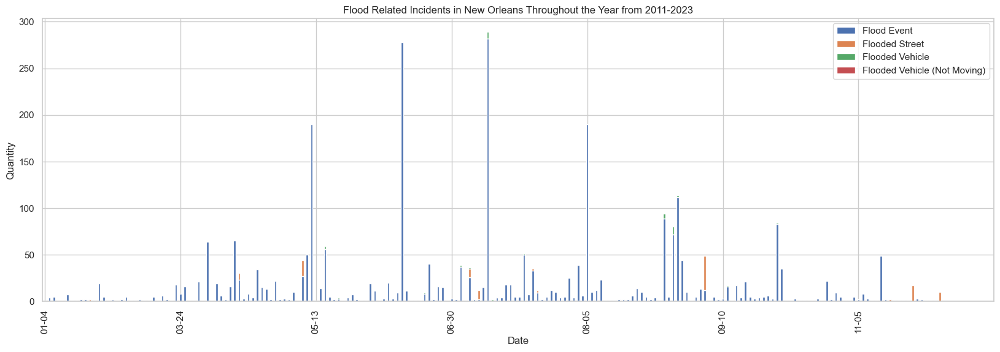

In [130]:
# create stacked bar plot of each kind of flood-related incident for each day during the year over all of the data
ax = floods_nested_df.unstack().plot(kind = "bar", stacked = True, figsize = (20,6))
xtick_interval = 30
ax.set_xticks(range(0, len(floods_nested_df), xtick_interval));
ax.set_ylabel("Quantity")
ax.set_title("Flood Related Incidents in New Orleans Throughout the Year from 2011-2023")
ax.legend(["Flood Event", "Flooded Street", "Flooded Vehicle", "Flooded Vehicle (Not Moving)"]);

Obviously, the presence of flooding is clearly related to the presence of weather events. As rain increases throughout the summer, there are more days with a higher number of flood related events, even among the days with abnormally high quantities. However, within that broader trend, the existence of the days with a much larger quantity of incidents cannot be explained by seasonal changes alone. It is more likely that these spikes are caused by individual weather events such as storms that exist within the broader seasonal trends.

## Data Matching

For a crime, given the date it occurred on, match it to weather from that day that is the closest geographical distance. We can do this by creating a custom function that takes in a row of the calls dataframe, extracts the date, latitude, and longitue of the entry, and then gets all weather from stations on that day. Of this list, we can then find the closest station by euclidean distance, and return the identifier for that station.

The calls for service dataframe is pretty large. Matching these entities will take awhile ***(>30 Minutes)***, even though we've vectorized our function - to save time, let's only run the match once, and then save it externally. We can then check if the table exists every time we run the cell, and if so, just load it and bypass generating the pairings more than once. 

In [131]:
# get rate sof null values for all attributes
(weather.isnull().mean() * 100)

Name                     0.000000
Latitude                 0.000000
Longitude                0.000000
Elevation                0.000000
AverageDailyWind        63.303377
NumDaysPrecipAvg        98.658376
FastestWindTime         98.705226
MultidayPrecipTotal     98.679671
PeakGustTime            87.720942
Precipitation            1.499212
Snowfall                80.361174
MinSoilTemp             99.872226
TimeAvgTemp             83.670514
TimeMaxTemp             43.017164
TimeMinTemp             43.064015
TempAtObs               81.042634
2MinMaxWindDirection    63.239491
5MinMaxWindDirection    63.367264
2MinMaxWindSpeed        63.239491
5MinMaxWindSpeed        63.367264
Fog                      0.000000
Heavy Fog                0.000000
Thunder                  0.000000
Ice Pellets              0.000000
Hail                     0.000000
Rime                     0.000000
Smoke                    0.000000
Tornado                  0.000000
High Wind                0.000000
Mist          

In [132]:
#entity matching

# warning, can take >30 mins
def match_weather(crime_row):
    # extract date, latitude, and longitude
    c_date = crime_row["DateCreate"]
    c_lat = crime_row["Latitude"]
    c_long = crime_row["Longitude"]
    # try to find weather on that day
    
    try:
        weather_by_day = weather.loc[c_date]
    except KeyError:
        return np.nan
    
    # if weather exists, get closest station identifier
    euc_distances = np.sqrt((weather_by_day['Latitude'] - c_lat) ** 2 + (weather_by_day['Longitude'] - c_long) ** 2)
    closest_station = euc_distances.idxmin()
    
    return(closest_station)                                       

In [133]:
match_table_path = '../data/match_table.csv'

calls_for_service["DateCreate"] = calls_for_service["TimeCreate"].dt.floor('D')

if os.path.exists(match_table_path):
    print("Loading Cached Entity Matching...")
    match_table = pd.read_csv(match_table_path)
    calls_for_service = calls_for_service.merge(match_table, on = "NOPD_Item", how = "outer")
    
else:
    print("Generating Entity Matching...")
    calls_for_service["ClosestStation"] = calls_for_service.progress_apply(match_weather, axis = 1)
    # If the file doesn't exist, save the DataFrame as a CSV
    match_table = calls_for_service[["NOPD_Item", "ClosestStation"]]
    match_table.to_csv(match_table_path, index=False)
    print("Dumping Relational Table to %s" %match_table_path)

Loading Cached Entity Matching...


In [134]:
calls_for_service.head()

,NOPD_Item,Type,TypeText,Priority,InitialType,InitialTypeText,InitialPriority,MapX,MapY,TimeCreate,TimeDispatch,TimeArrive,TimeClosed,Disposition,DispositionText,SelfInitiated,Beat,BLOCK_ADDRESS,Zip,PoliceDistrict,Location,Type_,TimeArrival,Longitude,Latitude,SimpleType,DateCreate,PairedStation
0,A3472220,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3688756.0,528696.0,2020-01-28 01:37:20,2020-01-28 01:37:20,2020-01-28 01:37:28,2020-01-28 02:25:50,NAT,Necessary Action Taken,N,4G04,Atlantic Ave & Slidell St,70114.0,4,POINT (-90.04525645 29.94750953),NaN,NaN,-90.045256,29.947510,Status,2020-01-28,US1LAOR0006
1,A0000220,21,COMPLAINT OTHER,1J,21,COMPLAINT OTHER,1J,3668710.0,533007.0,2020-01-01 00:00:42,2020-01-01 00:00:42,2020-01-01 00:00:42,2020-01-01 01:37:16,NAT,Necessary Action Taken,Y,2U04,034XX Broadway St,70125.0,2,POINT (-90.10840522 29.95996774),NaN,NaN,-90.108405,29.959968,Complaints/Environment,2020-01-01,USW00012930
2,A2190820,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3682445.0,530709.0,2020-01-17 21:18:41,2020-01-17 21:18:41,2020-01-17 21:18:47,2020-01-17 21:18:54,NAT,Necessary Action Taken,N,8B02,N Peters St & Bienville St,70130.0,8,POINT (-90.065113 29.95323762),NaN,NaN,-90.065113,29.953238,Status,2020-01-17,US1LAOR0009
3,A2029120,34S,AGGRAVATED BATTERY BY SHOOTING,2C,34S,AGGRAVATED BATTERY BY SHOOTING,2C,3696210.0,551411.0,2020-01-16 17:09:05,2020-01-16 17:09:43,2020-01-16 17:16:07,2020-01-16 22:49:37,RTF,REPORT TO FOLLOW,N,7A01,Chef Menteur Hwy & Downman Rd,70126.0,7,POINT (-90.02090137 30.00973449),NaN,NaN,-90.020901,30.009734,Violent Crime,2020-01-16,USW00053917
4,A3444420,20,AUTO ACCIDENT,1E,20,AUTO ACCIDENT,1E,3666298.0,529693.0,2020-01-27 19:59:59,2020-01-27 20:02:05,2020-01-27 20:14:58,2020-01-27 21:19:56,RTF,REPORT TO FOLLOW,N,2L04,Broadway St & S Claiborne Ave,70125.0,2,POINT (-90.11613127 29.95092657),NaN,NaN,-90.116131,29.950927,Accidents/Traffic Safety,2020-01-27,US1LAOR0014


Now that we have the matched station information, the combination of a weather station and a day can uniquely identify an observation in either table. With this, we can finally merge the two dataframes on the combination of these two keys.

In [135]:
# merge datasets together
calls_weather_master = pd.merge(calls_for_service, weather, left_on = ["DateCreate", "PairedStation"], right_on = ["Date", "Station"])
calls_weather_master.head()

,NOPD_Item,Type,TypeText,Priority,InitialType,InitialTypeText,InitialPriority,MapX,MapY,TimeCreate,TimeDispatch,TimeArrive,TimeClosed,Disposition,DispositionText,SelfInitiated,Beat,BLOCK_ADDRESS,Zip,PoliceDistrict,Location,Type_,TimeArrival,Longitude_x,Latitude_x,SimpleType,DateCreate,PairedStation,Name,Latitude_y,Longitude_y,Elevation,AverageDailyWind,NumDaysPrecipAvg,FastestWindTime,MultidayPrecipTotal,PeakGustTime,Precipitation,Snowfall,MinSoilTemp,TimeAvgTemp,TimeMaxTemp,TimeMinTemp,TempAtObs,2MinMaxWindDirection,5MinMaxWindDirection,2MinMaxWindSpeed,5MinMaxWindSpeed,Fog,Heavy Fog,Thunder,Ice Pellets,Hail,Rime,Smoke,Tornado,High Wind,Mist,Drizzle,Rain,Snow,Ground Fog
0,A3472220,22A,AREA CHECK,1K,22A,AREA CHECK,1K,3688756.0,528696.0,2020-01-28 01:37:20,2020-01-28 01:37:20,2020-01-28 01:37:28,2020-01-28 02:25:50,NAT,Necessary Action Taken,N,4G04,Atlantic Ave & Slidell St,70114.0,4,POINT (-90.04525645 29.94750953),NaN,NaN,-90.045256,29.947510,Status,2020-01-28,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,NaN,NaN,NaN,NaN,NaN,0.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,A3605320,18,TRAFFIC INCIDENT,1J,18,TRAFFIC INCIDENT,1J,3677293.0,536895.0,2020-01-28 23:40:43,2020-01-28 23:40:43,2020-01-28 23:40:43,2020-01-29 00:01:34,NAT,Necessary Action Taken,Y,1J03,026XX Saint Ann St,70119.0,1,POINT (-90.08116628 29.97040355),NaN,NaN,-90.081166,29.970404,Accidents/Traffic Safety,2020-01-28,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,NaN,NaN,NaN,NaN,NaN,0.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,A3557120,58,RETURN FOR ADDITIONAL INFO,0A,58,RETURN FOR ADDITIONAL INFO,1I,3679778.0,526277.0,2020-01-28 16:28:00,2020-01-28 21:33:43,2020-01-28 21:33:48,2020-01-28 23:01:01,NAT,Necessary Action Taken,N,6E04,012XX Saint Charles Ave,70130.0,6,POINT (-90.07368951 29.94113385),NaN,NaN,-90.073690,29.941134,Status,2020-01-28,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,NaN,NaN,NaN,NaN,NaN,0.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,A3600220,58,RETURN FOR ADDITIONAL INFO,1I,58,RETURN FOR ADDITIONAL INFO,1I,3692978.0,529591.0,2020-01-28 22:23:24,2020-01-28 22:23:24,2020-01-28 22:23:24,2020-01-28 22:52:46,NAT,Necessary Action Taken,Y,4H02,024XX Sanctuary Dr,70114.0,4,POINT (-90.03189416 29.94983828),NaN,NaN,-90.031894,29.949838,Status,2020-01-28,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,NaN,NaN,NaN,NaN,NaN,0.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,A3583520,TS,TRAFFIC STOP,1J,TS,TRAFFIC STOP,1J,3705091.0,512746.0,2020-01-28 19:33:37,2020-01-28 19:33:37,2020-01-28 19:33:37,2020-01-28 19:45:08,NAT,Necessary Action Taken,Y,4D05,057XX Tullis Dr,70131.0,4,POINT (-89.99426931 29.90313678),NaN,NaN,-89.994269,29.903137,Accidents/Traffic Safety,2020-01-28,US1LAOR0006,"NEW ORLEANS 2.1 ENE, LA US",29.961679,-90.038803,2.4,NaN,NaN,NaN,NaN,NaN,0.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,False,False,False,False,False,False,False,False,False,False,False


## Analysis
----------
Now that we have our data loaded and cleaned, we can use it to investigate some of the following questions and concepts:
- Effect of Precipitation on Average Quantity of Incident Types per Day
    - How does the presence of precipitation affect the number of each event type per day?
- Distribution of Violent vs Non-Violent Incidents across Daily Maximum Temperature
    - Do violent crimes tend to happen at days with higher temperatures than nonviolent crimes?
    - Do violent crimes happen with days with more extreme temperatures at different rates across New Orleans?


### Effect of Precipitation
First, one of the most elementary distinctions we can make is whether or not the precipitation on that day was 0 or greater than 0. How does this affect the average quantity of each type of incident on any given day?

In [136]:
# segment data by precipitation being 0 or non-0
precip_data = calls_weather_master.loc[calls_weather_master["Precipitation"]>0]
no_precip_data = calls_weather_master.loc[calls_weather_master["Precipitation"] == 0]

# how many of each kind of incident were there on each day in each data set?
precip_data_counts = precip_data.groupby(by = ["DateCreate"])["SimpleType"].value_counts().to_frame()
no_precip_data_counts = no_precip_data.groupby(by = ["DateCreate"])["SimpleType"].value_counts().to_frame()

# in each dataset, on average, how many were of each type on each day?
avg_precip_data_counts = precip_data_counts.groupby(by = ["SimpleType"]).mean()
avg_no_precip_data_counts = no_precip_data_counts.groupby(by = ["SimpleType"]).mean()
 
# merge data back together
total_avg_precip_counts = pd.merge(avg_precip_data_counts, avg_no_precip_data_counts, on = "SimpleType", suffixes = ("_precip", "_noprecip"))
total_avg_precip_counts.columns = ["PrecipPresent", "PrecipNotPresent"]

total_avg_precip_counts.head()

,PrecipPresent,PrecipNotPresent
SimpleType,,
Accidents/Traffic Safety,49.928854,65.570949
Alarms,26.324538,34.521739
Alcohol,1.398551,1.350427
Complaints/Environment,119.301837,157.387823
Domestic Violence,17.045213,22.742857


In [137]:
# melt data back out into duplicate rows, with presence of precipitation as indicator variable
melted_precip_counts = pd.melt(total_avg_precip_counts.reset_index(), id_vars = "SimpleType", value_vars = ["PrecipPresent", "PrecipNotPresent"], var_name = "Precip", value_name = "AvgCount")
melted_precip_counts.head()

,SimpleType,Precip,AvgCount
0,Accidents/Traffic Safety,PrecipPresent,49.928854
1,Alarms,PrecipPresent,26.324538
2,Alcohol,PrecipPresent,1.398551
3,Complaints/Environment,PrecipPresent,119.301837
4,Domestic Violence,PrecipPresent,17.045213


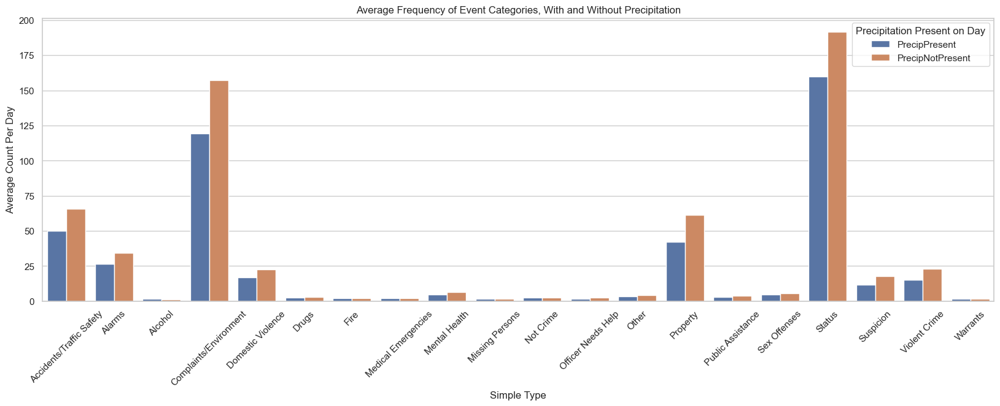

In [138]:
# create barplot, segment by 'precip'
plt.figure(figsize = (20,6))
precip_diffs = sns.barplot(melted_precip_counts, x = "SimpleType", y = "AvgCount", hue = "Precip")
# rotate long xtick labels
for item in precip_diffs.get_xticklabels():
    item.set_rotation(45)
precip_diffs.set(xlabel = "Simple Type", ylabel = "Average Count Per Day", title = "Average Frequency of Event Categories, With and Without Precipitation")

plt.legend(title = "Precipitation Present on Day")
plt.show()

This plot is the average number of each kind of incident on days where there was no precipitation recorded, versus the average where it was. Many kinds of instances ("Missing Persons", "Not Crime", "Fire", "Drugs") seem to be both minimal and also indifferent relatively to the presence of precipitation on that day. However, many of the largest categories ("Property", "Status", "Complaints/Environment", and "Accidents/Traffic Safety") all show demonstrably lower rates on days where precipitation was present versus when it was not.

We can go further and run test statistics on the difference of these averages. We can calculate, using a [T-Test](https://en.wikipedia.org/wiki/Student%27s_t-test), the change in standard deviation between the days with each kind of weather, and the confidence of the prediction that they are different. 

First, let's take our data for each kind of weather, and completely drop the date attribute - we only care about a day where there were 54 property crimes, a day with 97 property crimes, etc., as an individual instance. The types of crime are all rolled together as well, but we will separate them out next.

In [139]:
# drop date index
precip_data_raw = precip_data_counts.droplevel("DateCreate")
no_precip_data_raw = no_precip_data_counts.droplevel("DateCreate")

precip_data_raw.head(20)

,count
SimpleType,
Property,54
Complaints/Environment,53
Accidents/Traffic Safety,29
Status,25
Fire,22
Alarms,13
Domestic Violence,11
Violent Crime,11
Suspicion,6


Now, let's run our T-tests over all of our different categories. First, we'll create a dataframe to store all of our results. Then, we will enumerate over all of the different categories (which can be found by selecting all of the unique values in the index of our dataframe) - select the data from the days with precipitation and no precipitation of each kind, and conduct a T-Test. Note that these are non-parametric statistics. We won't be directly calculating these values, but we will be numerically finding their average over many permutations of our data, often referred to as [bootstrapping](https://en.wikipedia.org/wiki/Bootstrapping_(statistics)). While this is generallly weaker than directly calculating these statistics, this allows us relaxed assumptions about what these underlying distributions look like (namely, that they are normal). This will give us a T statistic, or the difference in standard deviations of the averages, and a p-value for the prediction (the chance that we arrived at the conclusion that they are different given that the averages were actually the same, or the chance that our null hypothesis is actually true). Then, we can store these results back into our dataframe, and compare the test statistics and confidence values for each category of incident.

In [140]:
# create dataframe to store results
t_tests = pd.DataFrame(columns = ["SimpleType", "TVal", "PVal"])
t_tests.set_index(["SimpleType"], inplace = True)

# for each category of incident
for i, kind in enumerate(precip_data_raw.index.unique()):
    # subselect category from each dataset
    subset_precip = precip_data_raw.loc[kind]
    subset_noprecip = no_precip_data_raw.loc[kind]
    # do numerical 2-sided ttest between the two, 50,000 perumutations
    ttest = stats.ttest_ind(subset_precip, subset_noprecip, nan_policy = 'omit', alternative = 'two-sided', permutations = 50000)
    # store results in dictionary, append to dataframe
    tval, pval = ttest.statistic[0], ttest.pvalue[0]
    temp_dict = pd.DataFrame({"TVal": tval, "PVal": pval}, index = [kind])
    t_tests = pd.concat([t_tests, temp_dict], ignore_index = False)


display(t_tests)

,TVal,PVal
Property,-13.718642,0.000020
Complaints/Environment,-9.611537,0.000020
Accidents/Traffic Safety,-9.314315,0.000020
Status,-4.030017,0.000020
Fire,0.015970,0.989140
Alarms,-8.525947,0.000020
Domestic Violence,-10.065440,0.000020
Violent Crime,-13.872960,0.000020
Suspicion,-9.708032,0.000020
Other,-7.481751,0.000020


Now, let's plot each of these values (annotated with the p values), and see what the test statistics tell us.

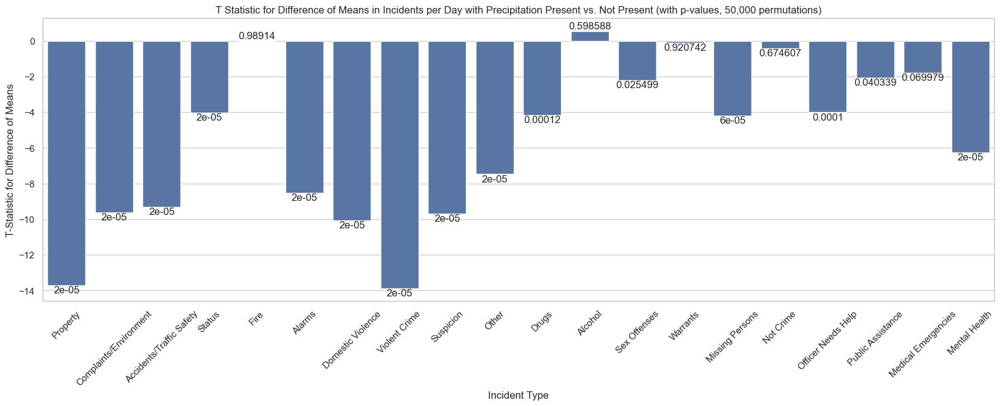

In [141]:
plt.figure(figsize = (20,6))

# make barplot
t_hist = sns.barplot(data = t_tests, x = t_tests.index, y = "TVal", color = 'b')

# rotate long xtick labels
for item in t_hist.get_xticklabels():
    item.set_rotation(45)

# annotate bars with PVal
for i, value in enumerate(t_tests['TVal']):
    if value < 0:
        plt.text(i, value -0.01, round(t_tests.iloc[i]["PVal"], 6), ha='center', va='top')
    else:
        plt.text(i, value + 0.01, round(t_tests.iloc[i]["PVal"], 6), ha='center', va='bottom')

t_hist.set(xlabel = "Incident Type", ylabel = "T-Statistic for Difference of Means", 
           title = "T Statistic for Difference of Means in Incidents per Day with Precipitation Present vs. Not Present (with p-values, 50,000 permutations)");

This chart tells us that there is probably a significant difference in the average rate of each incident between days with and without precipitation. It can be interpreted as, for example, that the days with precipitation present have on average 14 standard deviations fewer "Property" incidents occur, with a probability of 2e-05 that we observed this given that the underlying averages were actually equal. 

There are some interesting results here - namely that violent crime and property crime are observed at lower rates on days that precipitation is present. There are a few others that seem counterintuitive - first, that fires are reported at essentially equal rates between the two samples, despite the presence of precipitation. As well, traffic incidents are reported at a lower rate on days with precipitation by about 9 standard deviations, which goes against the intuition that people are worse drivers or get into more accidents in precipitation.

This gives us many options for modeling considerations -- since the presence of precipitation seems to have an effect on many of these rates, cumulative rates might potentially be able to predict precipitation, or precipitation might be able to predict future rates of incidents along columns that showed a more drastic change. 

### Effect of Temperature on the Rates of Violent Crime

One of the leading correlations found in prior research is that an increase in temperature generally corresponds to an increase in violent crime. Is this true in our dataset? We can investigate the distribution of violent and non-violent incidents across all temperatues, and see if violent crimes happen at a higher rate or lower rate in higher temperatures, or if they are the same.

Before we continue, there's an interesting wrinkle here. How much of our temperature data is empty?

In [142]:
# get rate of nans in TimeMaxTemp column
weather["TimeMaxTemp"].isnull().sum() * 100 / len(weather["TimeMaxTemp"])

43.017164274458025

Around 43%. There's an underlying mechanism for this missing data though. Let's look at the count of temperature observations when grouped by station to see where the issues are:

In [143]:
# get count of values by each station
weather.groupby(by = "Station")["TimeMaxTemp"].count()

Station
US1LAOR0003       0
US1LAOR0006       0
US1LAOR0009       0
US1LAOR0012       0
US1LAOR0014       0
US1LAOR0016       0
US1LAOR0019       0
USC00166666       0
USW00012916    4654
USW00012930    4126
USW00053917    4599
Name: TimeMaxTemp, dtype: int64

The missing value rate is because a large number of stations do not record temperature. Let's the station with the most temperature data, assuming maximum and minimum temperature for a day are homogeneous throughout the city, and use the data from those readings.

In [144]:
# create dataframe for temperature data
temp_df = calls_for_service[["NOPD_Item", "Longitude", "Latitude", "DateCreate", "SimpleType"]].copy().dropna(how = 'any')
# select temperature data from station "USW00012930"
temp_subselect = weather.loc[weather.index.get_level_values(1) == "USW00012930"][["TimeAvgTemp", "TimeMaxTemp", "TimeMinTemp"]]

# merge dataframes
temp_df = pd.merge(temp_df, temp_subselect, left_on = "DateCreate", right_on = "Date", how = "outer").progress_apply(lambda x: x)


  0%|          | 0/8 [00:00<?, ?it/s]

For each incident, we now have a greater number of readings for maximum, average, and minimum temperature throughout the day.

In [145]:
temp_df.head()

,NOPD_Item,Longitude,Latitude,DateCreate,SimpleType,TimeAvgTemp,TimeMaxTemp,TimeMinTemp
0,A3472220,-90.045256,29.947510,2020-01-28,Status,NaN,56.0,45.0
1,A3553920,-90.108122,29.989703,2020-01-28,Status,NaN,56.0,45.0
2,A3539420,-90.120693,29.955857,2020-01-28,Accidents/Traffic Safety,NaN,56.0,45.0
3,A3574220,-90.097326,29.977234,2020-01-28,Status,NaN,56.0,45.0
4,A3605320,-90.081166,29.970404,2020-01-28,Accidents/Traffic Safety,NaN,56.0,45.0


Let's see what the rate is for incidents overall for each daily maximum temperature by creating a bar plot of the number of crimes for each daily maximum temperature. Seaborn will standardize our data for us, by setting *stat = 'density'*, so that we get a distribution of the rates across all possible values.

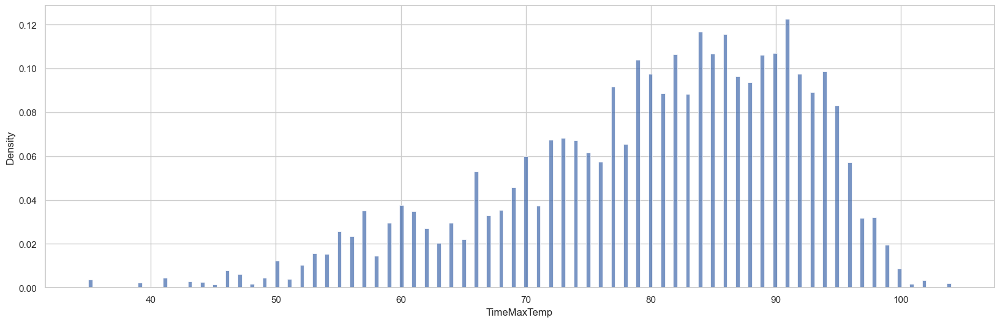

In [146]:
# plot density of all incidents given each temperature value
plt.figure(figsize = (20,6))
temp_hist = sns.histplot(data = temp_df, x = "TimeMaxTemp", stat = "density")

This seems to follow a reasonable distribution, similar to what intuitively temperatures in New Orleans themselves follow. 

Let's now add an indicator for violent incidents, and see if these distributions vary by any amount.

In [147]:
# create indicator IsViolent, turn into binary classification
temp_df["IsViolent"] = temp_df["SimpleType"] == "Violent Crime"
temp_df.head(10)

,NOPD_Item,Longitude,Latitude,DateCreate,SimpleType,TimeAvgTemp,TimeMaxTemp,TimeMinTemp,IsViolent
0,A3472220,-90.045256,29.947510,2020-01-28,Status,NaN,56.0,45.0,False
1,A3553920,-90.108122,29.989703,2020-01-28,Status,NaN,56.0,45.0,False
2,A3539420,-90.120693,29.955857,2020-01-28,Accidents/Traffic Safety,NaN,56.0,45.0,False
3,A3574220,-90.097326,29.977234,2020-01-28,Status,NaN,56.0,45.0,False
4,A3605320,-90.081166,29.970404,2020-01-28,Accidents/Traffic Safety,NaN,56.0,45.0,False
5,A3543420,-90.112553,29.931343,2020-01-28,Alarms,NaN,56.0,45.0,False
6,A3532020,-90.108405,29.959968,2020-01-28,Complaints/Environment,NaN,56.0,45.0,False
7,A3486920,-90.099057,29.980953,2020-01-28,Status,NaN,56.0,45.0,False
8,A3557120,-90.073690,29.941134,2020-01-28,Status,NaN,56.0,45.0,False
9,A3600220,-90.031894,29.949838,2020-01-28,Status,NaN,56.0,45.0,False


There is a lot going on under the hood of these plots.  We set the *stat = 'density'* as above, but since violent and nonviolent crimes happen separately, and we want to compare their relative rates, we need to standardize them separately. Thankfully, Seaborn will also do this for us, with the *common_norm = False* parameter. We set the hue of each distribution to the "IsViolent* parameter - the *'multiple'* and *'element'* parameters stack the distribtions on top of each other, and make them translucent so that we can more easily see the differences between the two.

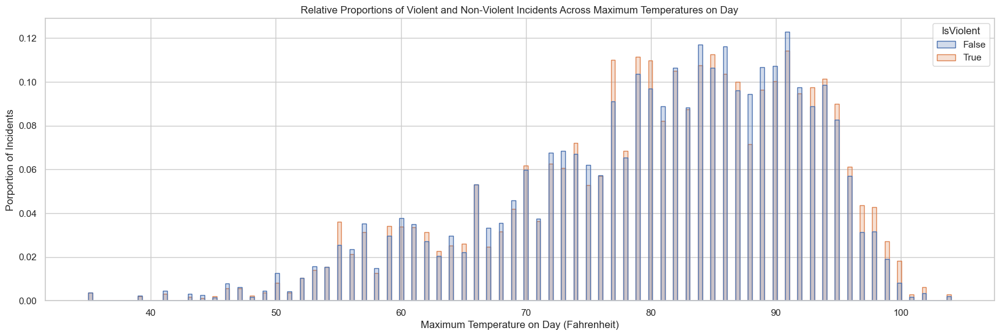

In [148]:
# make plots of violent and nonviolent distributions based on max day temperature, normalized separately so that they are comparable
plt.figure(figsize = (20,6))
viol_temp_hist = sns.histplot(data = temp_df, x = "TimeMaxTemp", hue = "IsViolent", 
                              stat = "density", multiple = "layer", common_norm = False, element = "step")
viol_temp_hist.set(xlabel = "Maximum Temperature on Day (Fahrenheit)", ylabel = "Porportion of Incidents", title = "Relative Proportions of Violent and Non-Violent Incidents Across Maximum Temperatures on Day");

From this plot, we can see that violent crimes do indeed happen at higher rates at higher daily maximum temperatures than nonviolent crimes (represented by the orange bars towards the right of the distribution being visible over the tops of the blue ones). However, what happens if we examine the daily minimum temperature?

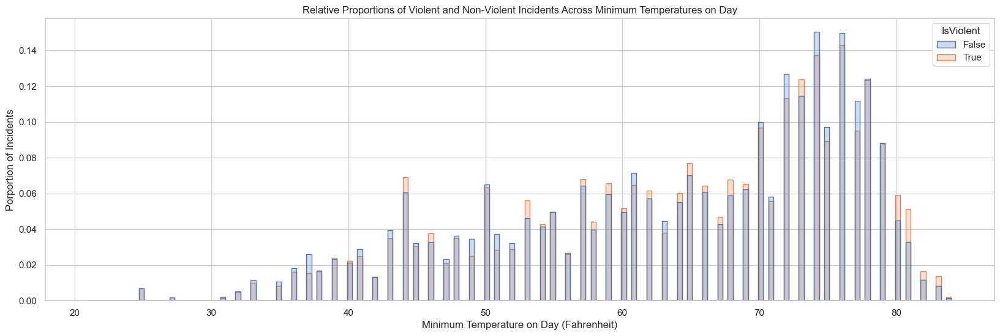

In [149]:
# make plots of violent and nonviolent distributions based on min day temperature, normalized separately so that they are comparable
plt.figure(figsize = (20,6))
viol_temp_hist = sns.histplot(data = temp_df, x = "TimeMinTemp", hue = "IsViolent", 
                              stat = "density", multiple = "layer", common_norm = False, element = "step")
viol_temp_hist.set(xlabel = "Minimum Temperature on Day (Fahrenheit)", ylabel = "Porportion of Incidents", title = "Relative Proportions of Violent and Non-Violent Incidents Across Minimum Temperatures on Day");

The axes for these two plots are going to be different - the spread of daily maximum temperatures is going to be higher than the spread of daily minimum temperatures overal. However, we can see that with an increase of daily minimum temperature (the lowest temperature of the day gets higher), that violent crime happens slightly more often when the minimum temperature is lower. This seems to indicate that violent crime increases overall when the extreme temperatures on either day expand. 

Let's go back to the maximum temperature data, and directly address the claim that violent crimes tend to happen on days with higher temperatures (> 90F) than nonviolent crimes.

Next, we can do a statistical test for the difference of proportions of violent crimes with respect to whether or not the daily maximum temperature was >90F.

In [150]:
# create indicator IsHot for if TimeMaxTemp was geq 90 degrees, turn into binary classification
temp_df["IsHot"] = temp_df["TimeMaxTemp"] >= 90.0
temp_df.head()

,NOPD_Item,Longitude,Latitude,DateCreate,SimpleType,TimeAvgTemp,TimeMaxTemp,TimeMinTemp,IsViolent,IsHot
0,A3472220,-90.045256,29.947510,2020-01-28,Status,NaN,56.0,45.0,False,False
1,A3553920,-90.108122,29.989703,2020-01-28,Status,NaN,56.0,45.0,False,False
2,A3539420,-90.120693,29.955857,2020-01-28,Accidents/Traffic Safety,NaN,56.0,45.0,False,False
3,A3574220,-90.097326,29.977234,2020-01-28,Status,NaN,56.0,45.0,False,False
4,A3605320,-90.081166,29.970404,2020-01-28,Accidents/Traffic Safety,NaN,56.0,45.0,False,False


In [151]:
# get number of incidents for each combination of IsHot and IsViolent
temp_df_hot_gb = temp_df.groupby(by = ["IsHot", "IsViolent"])["NOPD_Item"].count()
temp_df_hot_gb

IsHot  IsViolent
False  False        776335
       True          29198
True   False        257354
       True          10537
Name: NOPD_Item, dtype: int64

Now, let's take the number of violent crimes, and the number of total crimes in each classification and run a [difference of proportions test](https://online.stat.psu.edu/stat415/lesson/9/9.4). This will give us a Z-value, and a P-Value that we can use to assess the magnitude and confidence of the difference. Thankfully, instead of having to do it by hand, there is a [statsmodels proportions_ztest](https://www.statsmodels.org/stable/generated/statsmodels.stats.proportion.proportions_ztest.html) function we can load and use.

In [152]:
# get counts of violent crimes in each classification
hot_c = temp_df_hot_gb[True, True]
not_hot_c = temp_df_hot_gb[False, True]

# get sample size of each classification
hot_n = temp_df_hot_gb[True, True] + temp_df_hot_gb[True, False]
not_hot_n = temp_df_hot_gb[False, True] + temp_df_hot_gb[False, False]

n_array = np.array([hot_n, not_hot_n])
c_array = np.array([hot_c, not_hot_c])

# perform difference of proportions test.
zval, pval = proportions_ztest(c_array, n_array, alternative = 'larger')

print("P-Value:", pval)

P-Value: 1.1556238891735672e-13


While the difference seemed visually acute on our graphs, given that the p value for the test is well below 0.05, given the large sample size - we can confidently say that the proportion of violent incidents is greater for days where the maximum temperature is greater than 90 degrees fahrenheit than for days where it lower than 90 degrees fahrenheit. Note critically that while this test allows us to claim that there is a difference, it does not allow us to make any claim about the magnitude or significance therein of the difference itself.

### Locational Distribution of Violent Crimes on days with Extreme Maximum or Minimum Daily Temperature

If an increase in temperature does correspond to a greater prevalence of violent incidents, where do they happen geographically? Are certain areas of the city more or less vulnerable to violence based on extreme temperatures?

In [153]:
# subselect violent incidents
violent_incidents = temp_df.loc[temp_df["SimpleType"] == 'Violent Crime']
violent_incidents.head()

,NOPD_Item,Longitude,Latitude,DateCreate,SimpleType,TimeAvgTemp,TimeMaxTemp,TimeMinTemp,IsViolent,IsHot
24,A3548720,-90.106546,29.969927,2020-01-28,Violent Crime,NaN,56.0,45.0,True,False
50,A3571420,-90.098663,29.973679,2020-01-28,Violent Crime,NaN,56.0,45.0,True,False
118,A3500320,-90.081004,29.938222,2020-01-28,Violent Crime,NaN,56.0,45.0,True,False
120,A3587520,-90.050751,30.001026,2020-01-28,Violent Crime,NaN,56.0,45.0,True,False
188,A3481720,-90.050159,30.002987,2020-01-28,Violent Crime,NaN,56.0,45.0,True,False


From earlier, we notice that only three of the stations actually take temperature readings. Let's take the mean values recorded for each one, and use it to set our definition for what 'extreme' temperature means.

In [154]:
weather.groupby(by = "Station")["TimeMaxTemp"].mean()

Station
US1LAOR0003          NaN
US1LAOR0006          NaN
US1LAOR0009          NaN
US1LAOR0012          NaN
US1LAOR0014          NaN
US1LAOR0016          NaN
US1LAOR0019          NaN
USC00166666          NaN
USW00012916    79.902879
USW00012930    80.475036
USW00053917    78.820613
Name: TimeMaxTemp, dtype: float64

To continue, we need data that lacks empty values. Let's subselect our data again for where the temperature recorded must have some value, and get our overall average temperature for the entire dataset.

In [155]:
violent_incidents = violent_incidents[violent_incidents["TimeMaxTemp"].isnull()==False]
violent_incidents["TimeMaxTemp"].mean()

80.46237456080483

We can have two kinds of extreme temperature: extremely low, and extremely hot. Let's use a simple definition of extreme: extremely high is in the fourth quartile, and extremely low is in the first quartile. We can split our data into two groups, and plot their location across New Orleans. 

In [156]:
max_temp_percentiles = np.percentile(violent_incidents['TimeMaxTemp'], [25, 75])
print("25th percentile of Maximum Temperature", max_temp_percentiles[0])
print("75th percentile of Maximum Temperature:", max_temp_percentiles[1])

25th percentile of Maximum Temperature 73.0
75th percentile of Maximum Temperature: 90.0


Graph the violent incidents below. We can then examine the locational distribution based on whether the temperature was very high or very low. To do our visualization, we will use the [folium](https://python-visualization.github.io/folium/latest/) library, which is a simple map plotting library that can create interactive JavaScript elements inline within our notebook.

In [157]:
# select only x,y,z, drop empty values
violent_incidents_clean = violent_incidents[["TimeMaxTemp", "Longitude", "Latitude"]].dropna(how = 'any')
# create folium map entity
combined_map = folium.Map(location=[30, -90], tiles="Cartodb dark_matter", zoom_start=12.8)

# add markers to map object
for index, row in violent_incidents_clean.iterrows():

    # generate marker for either high or low outlier
    if(row['TimeMaxTemp'] < max_temp_percentiles[0]):
        kw = {"color": "blue"}
        icon = folium.Icon(**kw)
        folium.CircleMarker([row['Latitude'], row['Longitude']], color='blue', radius=3, stroke=False,fill=True, fill_opacity=0.5 ,opacity=1).add_to(combined_map)
    elif(row['TimeMaxTemp'] > max_temp_percentiles[1]):
        kw = {"color": "green"}
        icon = folium.Icon(**kw)
        folium.CircleMarker([row['Latitude'], row['Longitude']], color='red', radius=3, stroke=False,fill=True, fill_opacity=0.3 ,opacity=1).add_to(combined_map)

combined_map


This plot shows the occurrence of violent events when the temperature for that day is in the upper quartile of maximum temperature for that day (in red) and when it's in the lower quartile of maximum temperature for that day (in blue). While there are certainly clusters of points, notably around the French Quarter and downtown, which temperature extreme they fall in seems to be uniformly distributed across the city - which suggests that geographically the city is generally not sensitive to violence along extremes of temperature more or less in any given area. That is, violent crimes do not happen disproportionately in certain areas of the city given extremely high or low maximum day temperatures. But, this is hard to truly compare just to the naked eye and you can actually notice some interesting trends when you zoom in on certain areas. For example, nearly all the violent crime incidents around Tulane's campus are on colder days which lines up with the fact that students are gone most of the summer. 

## Modeling

For our model, we chose to do a **Generalized Additive Model** after testing a multitude of different models. With some of our initial models failing to get good predictive results, we went back and examined more research until we came across GAMs. In the follow section is some information on the paper we based our modeling after and also some info on pyGAM, a python package for building Generalized Additive Models.

### Background

An important aspect of the data that we focused on in our analysis was the locational distribution of crimes, specifically violent ones, and the posssible relation to weather. Modeling conditional geospatial distributions is not a novel concept as it turned out, and we found a similar study based out of Oslo [found here](https://crimesciencejournal.biomedcentral.com/articles/10.1186/s40163-022-00171-2). They investigated the impact of numerous weather features on the spatial distribution of crime with a generalized additive model, which they found to be more robust than other models used for this task. In modeling the effects of weather, GAMs allows for describing the "difference between two or more spatial surfaces" and the corresponding statistical significance. The key is including the coordinates as a semiparametric spline term which captures the details of the surface. This study failed to reject the initial null hypothesis - there was not evidence of an effect of weather upon the spatial distribution of crime in Oslo. But, their methods were encouraging and well-founded so we decided to apply similar principles to New Orleans.

The use of GAMs is made possible via the python library [pyGAM](https://pygam.readthedocs.io/en/latest/), which provides a convenient method for fitting and interpreting GAM models in python. The simplest way to think of GAMs is as a way of piecing together multiple simple wave functions to create a more flexible model for features such as coordinates. These simpler functions are referred to as "splines", and the key is that they are smooth (infinitely differentiable) and thus can be combined to effectively model complex relationships. A driving factor behind our choice for GAMs is also their lack of assumptions about the underlying data distribution; given that we are modeling the counts of frequency, poisson distribution functions are useful for describing the rough shapes, but given the inclusion of spatial data, as well as seasonal data, nonparametric approaches allow us to minimize any assumptions we make in our modeling about underlying functional behavior.

### Preprocessing for GAM

First we trim down the master dataframe based on features we need for our model.

In [158]:
# create smaller cfs dataset
cfs_ml = calls_weather_master[["NOPD_Item", "TimeCreate", "Zip", "Longitude_x", "Latitude_x", "SimpleType", "TimeMaxTemp", "PairedStation", "DateCreate", "Precipitation"]]
cfs_ml.head()

,NOPD_Item,TimeCreate,Zip,Longitude_x,Latitude_x,SimpleType,TimeMaxTemp,PairedStation,DateCreate,Precipitation
0,A3472220,2020-01-28 01:37:20,70114.0,-90.045256,29.947510,Status,NaN,US1LAOR0006,2020-01-28,0.01
1,A3605320,2020-01-28 23:40:43,70119.0,-90.081166,29.970404,Accidents/Traffic Safety,NaN,US1LAOR0006,2020-01-28,0.01
2,A3557120,2020-01-28 16:28:00,70130.0,-90.073690,29.941134,Status,NaN,US1LAOR0006,2020-01-28,0.01
3,A3600220,2020-01-28 22:23:24,70114.0,-90.031894,29.949838,Status,NaN,US1LAOR0006,2020-01-28,0.01
4,A3583520,2020-01-28 19:33:37,70131.0,-89.994269,29.903137,Accidents/Traffic Safety,NaN,US1LAOR0006,2020-01-28,0.01


Below is the spatial distribution of all types of crime within New Orleans. We are going to bin these crimes based on their lattiude and longtitude in the following cells. This will give us something to model and predict the spatial distribution more easily with the GAM. 

Text(0.5, 1.0, 'Distribution of Crime by Location')

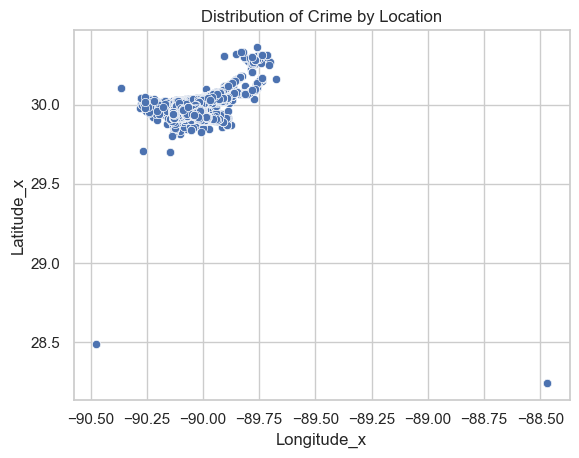

In [159]:
# Plot coordinates of violent crime with seabron
sns.scatterplot(cfs_ml, x = "Longitude_x", y = "Latitude_x")
plt.title("Distribution of Crime by Location")

Get rid of some outliers...

In [160]:
# Filter off those two crimes with likely misinupt coordinates
cfs_ml = cfs_ml[(cfs_ml["Longitude_x"] < -89.5) & (cfs_ml["Latitude_x"] > 29.5)]

Next, to reduce the amount of noise in our model, we are going to convert the spatial coordinate data into spatial bins. By grouping occurrences into these bins, we can step over a lot of the finer noise in the spatial distribution, and examine the broader areas across the city.

We can create evenly spaced bins using the [numpy linspace](https://numpy.org/doc/stable/reference/generated/numpy.linspace.html) function, and then assign each coordinate to its repsective bin using the [numpy digitize](https://numpy.org/doc/stable/reference/generated/numpy.digitize.html) function.

In [177]:
# creating geospatial bins, nxn
n = 20

# create bins
long_bins = np.linspace(cfs_ml["Longitude_x"].min() - 0.1, cfs_ml["Longitude_x"].max() + 0.1, n + 1)
lat_bins = np.linspace(cfs_ml["Latitude_x"].min() - 0.1, cfs_ml["Latitude_x"].max() + 0.1, n + 1)

# assign each crime to a latitude and longitude bin
cfs_ml["Long_bin"] = np.digitize(cfs_ml["Longitude_x"], long_bins)
cfs_ml["Lat_bin"] = np.digitize(cfs_ml["Latitude_x"], lat_bins)

cfs_ml.head()

,NOPD_Item,TimeCreate,Zip,Longitude_x,Latitude_x,SimpleType,TimeMaxTemp,PairedStation,DateCreate,Precipitation,Long_bin,Lat_bin,YearCreate,MonthCreate,DayCreate
0,A3472220,2020-01-28 01:37:20,70114.0,-90.045256,29.947510,Status,NaN,US1LAOR0006,2020-01-28,0.01,10,9,2020,1,28
1,A3605320,2020-01-28 23:40:43,70119.0,-90.081166,29.970404,Accidents/Traffic Safety,NaN,US1LAOR0006,2020-01-28,0.01,9,9,2020,1,28
2,A3557120,2020-01-28 16:28:00,70130.0,-90.073690,29.941134,Status,NaN,US1LAOR0006,2020-01-28,0.01,9,8,2020,1,28
3,A3600220,2020-01-28 22:23:24,70114.0,-90.031894,29.949838,Status,NaN,US1LAOR0006,2020-01-28,0.01,10,9,2020,1,28
4,A3583520,2020-01-28 19:33:37,70131.0,-89.994269,29.903137,Accidents/Traffic Safety,NaN,US1LAOR0006,2020-01-28,0.01,11,8,2020,1,28


We also extract the year, month, and day into individual features for the purpose of using them as features within the GAM. In doing so, we can use the month of the ocurrence as a proxy for seasonality within any individual year (do these incidents happen more in June/July/August than they do in January/February?), and then the year as a proxy for nonseasonal changes increasing over time (does the count of incidents in a given month increase over time?). By converting it into separate parts, we can assign a term in our model to each component and incorporate it into our predictions.

In [165]:
# Create new columns for year, month, and day
cfs_ml["YearCreate"] = cfs_ml["DateCreate"].apply(lambda x: x.year)
cfs_ml["MonthCreate"] = cfs_ml["DateCreate"].apply(lambda x: x.month)
cfs_ml["DayCreate"] = cfs_ml["DateCreate"].apply(lambda x: x.day)


cfs_ml.head()

,NOPD_Item,TimeCreate,Zip,Longitude_x,Latitude_x,SimpleType,TimeMaxTemp,PairedStation,DateCreate,Precipitation,Long_bin,Lat_bin,YearCreate,MonthCreate,DayCreate
0,A3472220,2020-01-28 01:37:20,70114.0,-90.045256,29.947510,Status,NaN,US1LAOR0006,2020-01-28,0.01,10,9,2020,1,28
1,A3605320,2020-01-28 23:40:43,70119.0,-90.081166,29.970404,Accidents/Traffic Safety,NaN,US1LAOR0006,2020-01-28,0.01,9,9,2020,1,28
2,A3557120,2020-01-28 16:28:00,70130.0,-90.073690,29.941134,Status,NaN,US1LAOR0006,2020-01-28,0.01,9,8,2020,1,28
3,A3600220,2020-01-28 22:23:24,70114.0,-90.031894,29.949838,Status,NaN,US1LAOR0006,2020-01-28,0.01,10,9,2020,1,28
4,A3583520,2020-01-28 19:33:37,70131.0,-89.994269,29.903137,Accidents/Traffic Safety,NaN,US1LAOR0006,2020-01-28,0.01,11,8,2020,1,28


### Temperature vs Violence

Since we are looking at the the spatial distribution of violent crimes, we create a table which gives the count of incidents on a given day for each bin within the 30x30 grid. There's quite a lot going on in this cell. First, we filter our data exclusively by violent crime. The next line gets the count of these incidents on a given date, in a given bin, and reformats it as a dataframe. The followwing line then splices the date, temperature, and other components back together, and removes redundant columns. We then rename the columns, drop a redundant one, and filter for missing values.

In [168]:
# filter by violent incidents
v_cfs_ml = cfs_ml[cfs_ml["SimpleType"] == "Violent Crime"]

# get counts for each day in each bin
v_cfs_ml_counts = v_cfs_ml[["DateCreate", "Long_bin", "Lat_bin", "NOPD_Item", "SimpleType"]].groupby(by = ["DateCreate", "Long_bin", "Lat_bin", "SimpleType"]).count().reset_index()

# merge back with rest of information
v_cfs_ml_counts = v_cfs_ml_counts.merge(v_cfs_ml[["DateCreate", "TimeMaxTemp", "YearCreate", "MonthCreate", "DayCreate"]].groupby(by = "DateCreate").max(), how = 'left', on = "DateCreate", 
                                                  indicator = False, validate = "many_to_many").drop(["DateCreate"], axis = 1)

# rename NOPD_count column
v_cfs_ml_counts.columns = ['Long_bin', 'Lat_bin', 'SimpleType', 'Count', 'TimeMaxTemp', 'YearCreate', 'MonthCreate', 'DayCreate']

# drop redundant simpletype column
v_cfs_ml_counts.drop("SimpleType", inplace = True, axis = 1)


# drop missing values
v_cfs_ml_counts.dropna(inplace = True)


v_cfs_ml_counts.head()

,Long_bin,Lat_bin,Count,TimeMaxTemp,YearCreate,MonthCreate,DayCreate
0,8,9,2,61.0,2020,1,1
1,9,8,5,61.0,2020,1,1
2,9,9,10,61.0,2020,1,1
3,9,10,2,61.0,2020,1,1
4,10,8,1,61.0,2020,1,1


We split the bin counts into separate dataframes, hot and cold, occurring on 90 degrees Fahrenheit (New Orleans is a hot place it turns out). This threshold was determined from our EDA section, as it was the threshold that we best found to segment where violent incidents have an increased proportional rate. We will fit separate models to each dataframe and then see if we observe a statistically significant difference.

In [169]:
# create two new datasets by temperature values
v_cfs_hot = v_cfs_ml_counts[v_cfs_ml_counts["TimeMaxTemp"] > 90.0]
v_cfs_cold = v_cfs_ml_counts[v_cfs_ml_counts["TimeMaxTemp"] <= 90.0]

v_cfs_hot.head()

,Long_bin,Lat_bin,Count,TimeMaxTemp,YearCreate,MonthCreate,DayCreate
1397,9,8,2,93.0,2020,5,21
1398,9,9,4,93.0,2020,5,21
1399,10,8,1,93.0,2020,5,21
1400,10,9,2,93.0,2020,5,21
1401,10,10,5,93.0,2020,5,21


First, we fit the GAM to the hot data after splitting the data into a train and test set (takes about 2 minutes total). We use a [PoissonGAM model](https://pygam.readthedocs.io/en/latest/api/poissongam.html), and perform a gridsearch over lambda, the smoothing parameter, and n_splines, the number of splines to use. Again, we are using the assumption that of the distributions in the library, a poisson distribution is the best fit to model the count of ocurrences created by some underlying process, 



We predict the number of violent incidents within each gridbox on a given day based on the temperature. The summary statistics are slightly harder to interpret than your standard sklearn model, but the most important number we looked for was the Psuedo R-Squared - which told us how well our model explained the variance within the data. This is also the value that the [pygam gridsearch](https://pygam.readthedocs.io/en/latest/api/poissongam.html#pygam.pygam.PoissonGAM.gridsearch) function will optimize with respect to. For the days where the temperature was greater than 90 degrees, these modelds are able to capture around 60% of the observed variance, which is in line with other studies. Of note is the effective degrees of freedom (DoF), which is quite high at about 38. This suggests our model might be slightly biased or overfit for complexity, but this is the best value possible while still maintaining a sufficient capture of the relationship. Unlike a regression model, the p-values for each spline are not useful metrics - given that an intercept feature is fit, we are now combining linear and non-linear terms, and so the values that the package displays are miscalculated. 

In [170]:
# split data into attributes and targets
hot_X = pd.get_dummies(v_cfs_hot.drop(["Count"], axis = 1), dtype = 'int')
hot_y = v_cfs_hot["Count"]

# split into seen and unseen data
hot_X_train, hot_X_test, hot_y_train, hot_y_test = train_test_split(hot_X, hot_y, test_size = 0.20, random_state = 0)

# initialize model
hotgam = PoissonGAM()

# hyperparameters to search over
lam_grid = [0, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008, 0.0009, 0.001]
splines_grid = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# conduct grid search over hyperparameters
hotgam.gridsearch(hot_X_train.values, hot_y_train.values, n_splines = splines_grid, lam = lam_grid)
print(hotgam.summary())

100% (110 of 110) |######################| Elapsed Time: 0:00:04 Time:  0:00:04


PoissonGAM                                                                                                
=============================================== ==========================================================
Distribution:                       PoissonDist Effective DoF:                                     37.7904
Link Function:                          LogLink Log Likelihood:                                 -4511.3565
Number of Samples:                         2572 AIC:                                             9098.2939
                                                AICc:                                             9099.513
                                                UBRE:                                               2.8734
                                                Scale:                                                 1.0
                                                Pseudo R-Squared:                                   0.6009
Feature Function                  Lam

Now let's do some predictions on the test set for the hot data.  The mean absolute percentage error is 0.471, which we will explain below after we model the cold data.

In [178]:
# what is the mean squared error of the model on the hot data?
y_pred = hotgam.predict(hot_X_test)

# filter for any broken predictions
inf_indices = np.isinf(y_pred)
y_pred_clean = y_pred[~inf_indices]
hot_y_test_clean = hot_y_test[~inf_indices]

print("Broken Predictions: %d" %(inf_indices.sum()))
mape = mean_absolute_percentage_error(y_pred_clean, hot_y_test_clean)
print(mape)


Broken Predictions: 0
0.4717844727392372


Now, we follow an identical process for fitting the model to days where the temperature was less than 90 degrees Fahrenheit. This model takes longer to fit, up to 9 minutes. The psuedo R-squared is 0.5389, which is not far off the above model, and indicates a good fit on the data. 

In [179]:
# fit gam to cold data
# can take around 9 mins to fit

# split data into attributes and targets
cold_X = pd.get_dummies(v_cfs_cold.drop(["Count"], axis = 1), dtype = 'int')
cold_y = v_cfs_cold["Count"]

# split into seen and unseen data
cold_X_train, cold_X_test, cold_y_train, cold_y_test = train_test_split(cold_X, cold_y, test_size = 0.20, random_state = 0)

# initialize model
coldgam = PoissonGAM() 

# hyperparameters to search over
lam_grid = [0, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008, 0.0009, 0.001]
splines_grid = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# conduct grid search over hyperparameters
coldgam.gridsearch(cold_X_train.values, cold_y_train.values, n_splines = splines_grid, lam = lam_grid)
print(coldgam.summary())

100% (110 of 110) |######################| Elapsed Time: 0:00:07 Time:  0:00:07


PoissonGAM                                                                                                
=============================================== ==========================================================
Distribution:                       PoissonDist Effective DoF:                                     43.9985
Link Function:                          LogLink Log Likelihood:                                -14807.9279
Number of Samples:                         8427 AIC:                                            29703.8528
                                                AICc:                                           29704.3468
                                                UBRE:                                               2.8862
                                                Scale:                                                 1.0
                                                Pseudo R-Squared:                                   0.5389
Feature Function                  Lam

We then calculate and print the MAPE of the 'cold' GAM model below.

In [185]:
# what is the mean squared error of the model on the cold data?
y_pred = coldgam.predict(cold_X_test)

inf_indices = np.isinf(y_pred)
y_pred_clean = y_pred[~inf_indices]
cold_y_test_clean = cold_y_test[~inf_indices]

print("Broken Predictions: %d" %(inf_indices.sum()))
mape = mean_absolute_error(y_pred_clean, cold_y_test_clean)
print(mape)


Broken Predictions: 0
1.2703372027921234


Now we compare each model's ability to predict the violent crime counts on the entire dataset. We use the mean absolute percentage error because it better explains the difference in forecasting between the two models. As you see below, the hot model has a much lower MAPE than the cold model despite them having similar mean absolute errors. This suggest their forecasting abilities differ drastically, which suggest less of a predictive utility for this model.  

In [181]:
# how does each model perform on the entire dataset?
X = v_cfs_ml_counts.drop("Count", axis = 1)
y = v_cfs_ml_counts["Count"]

cold_y_pred = coldgam.predict(X)
hot_y_pred = hotgam.predict(X)


# large imbalance of 0 - we can have low mean absolute error, but mean absolute percentage error is more useful in 
# examining how much the models differ from each otehr in terms of forecasting

hotmape = mean_absolute_percentage_error(hot_y_pred, y)
hotmae = mean_absolute_error(hot_y_pred, y)
print("'Hot' Mean Absolute Percentage Error: %.3f\n'Hot' Mean Absolute Error: %.3f\n" %(hotmape, hotmae))

coldmape = mean_absolute_percentage_error(cold_y_pred,y)
coldmae = mean_absolute_error(cold_y_pred, y)
print("'Cold' Mean Absolute Percentage Error: %.3f\n'Cold' Mean Absolute Error: %.3f" %(coldmape, coldmae))


'Hot' Mean Absolute Percentage Error: 0.505
'Hot' Mean Absolute Error: 2.518

'Cold' Mean Absolute Percentage Error: 327534518354.673
'Cold' Mean Absolute Error: 1.279


Obviously the mean absolute percentage errors between these models vary wildly. What is going on here?

A lot of the observed data is either 0, or very close to 0. So while there might be a slight difference in prediction rate, relative to an immensely small true label, the percentage error can explode. The MAE is generally used to diagnose the overall accuracy of a model, but this is important to demonstarate as even within the subtle difference in the MAE value, these models do make different predictions, which hint that there is potentially a more significant difference between them.

### Checking Significance By Grid Location

Now, we check if there is a significant difference between the predicted spatial distributions of crime on hot versus cold days. This is far more nuanced than simply connecting temperature and crime across the entire city - we are actually breaking the areas of New Orleans down and examining the differences between our models. As the spatial significance grid will demonstrate, with this approach we can really see how differing temperatures can affect certain parts of the city and allow us to draw more insightful conclusions.

Below we calculate the predicted counts of violent incidents for both the hot and cold temperature models on the entire dataset of violent crimes. We create a new dataframe pred_diffs_df which contains the unique combinations of longitude and latitude bins. We then add the predicted counts from the two models to this dataframe.

In [187]:
# get predictions for each model
hot_pred = hotgam.predict(X)
cold_pred = coldgam.predict(X)

# create dataframe of unique bins
pred_diffs_df = X[["Long_bin", "Lat_bin"]].drop_duplicates()

# add predictions to dataframe
X["hot_pred_count"] = hot_pred
X["cold_pred_count"] = cold_pred


pred_diffs_df.head()

,Long_bin,Lat_bin
0,8,9
1,9,8
2,9,9
3,9,10
4,10,8


Now we are ready to perform a statistical test with the data properly prepared and predicted. The aim of this test is to see if there is a significant different between the hot and cold model for the count prediction of each bin within the grid. We do this with a [Mann-Whitney U test](https://www.statology.org/mann-whitney-u-test/), a non parametric statistical test used to compare two independent samples. We use the [scipy mannwhitneyu](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.mannwhitneyu.html) implementation here. Since we use the one-sided alternative, we can test if the model fit on hotter data predicts significantly higher average values than the model fit on colder data, without making assumptions of the centrality or symmetry of the predictions themselves.

In [191]:
# given a row of coordinate values, are the predictions between the models significantly different?
def mann_whitney_bin(row):
    # extract coordinate values
    target_long, target_lat = row["Long_bin"], row["Lat_bin"]
    # select data based on coordinates
    target_rows = X[(X["Long_bin"] == target_long) & (X["Lat_bin"] == target_lat)]
    # select predictions from model
    hot_preds = target_rows["hot_pred_count"]
    cold_preds = target_rows["cold_pred_count"]
    # runn mannwhitney U test
    ustat, pval = mannwhitneyu(hot_preds, cold_preds, alternative = 'greater')
    return ustat, pval

# apply to generated list of unique bin coordinates
pred_diffs_df[["UStat", "PVal"]] = pred_diffs_df.progress_apply(mann_whitney_bin, axis = 1, result_type = 'expand')

pred_diffs_df.head()

  0%|          | 0/37 [00:00<?, ?it/s]

,Long_bin,Lat_bin,UStat,PVal
0,8,9,651199.0,3.978217e-45
1,9,8,1227946.0,1.093721e-111
2,9,9,1398408.0,1.560836e-156
3,9,10,460483.0,1.522088e-67
4,10,8,679479.0,2.344271e-83


We now check for the bins where there was a significant difference, determined in our case by a p-value less than 0.05, and assign a label indicating if so.

In [192]:
# Label the significant rows as True
pred_diffs_df["Significant"] = (pred_diffs_df["PVal"] < 0.05)
pred_diffs_df.head(20)

,Long_bin,Lat_bin,UStat,PVal,Significant
0,8,9,651199.0,3.978217e-45,True
1,9,8,1227946.0,1.093721e-111,True
2,9,9,1398408.0,1.560836e-156,True
3,9,10,460483.0,1.522088e-67,True
4,10,8,679479.0,2.344271e-83,True
5,10,9,1284353.0,5.377456e-150,True
6,10,10,964719.0,9.588653e-89,True
7,11,8,568437.0,1.126920e-62,True
8,11,10,856716.0,3.022422e-67,True
9,11,11,415552.0,2.818562e-52,True


#### Plotting Bin Count Prediction Difference

In [193]:
# Calculate the boundaries of the plot
pred_diffs_df["Long_1"] = long_bins[pred_diffs_df["Long_bin"] - 2]
pred_diffs_df["Long_2"] = long_bins[pred_diffs_df["Long_bin"] - 1]
pred_diffs_df["Lat_1"] = lat_bins[pred_diffs_df["Lat_bin"] - 2]
pred_diffs_df["Lat_2"] = lat_bins[pred_diffs_df["Lat_bin"] - 1]

# Normalize the UStat values for plotting. Not a stastistical measure, just for visualization
pred_diffs_df["hue"] = (pred_diffs_df["UStat"]-pred_diffs_df["UStat"].min() * 1.5) / ((pred_diffs_df["UStat"].max() * 1.5) - pred_diffs_df["UStat"].min() * 1.5)


Using Folium, we now plot the difference in predictions between each model for the bins within our 30x30 grid. The hue of each box represents the U-statistic - a darker hue represents a higher U-statitic, meaning that there is a greater increase between the predicted counts of the hot and cold models. Highlighting each rectangle will show the one-sided U statistic, and the p-value associated with it.

In [198]:
# initialize folium map
significance_map = folium.Map(location=[30, -90], zoom_start=10.5)

# for row in data where test was significant, render and plot rectangle
for i, row in pred_diffs_df[pred_diffs_df["Significant"] == True].iterrows():

    folium.Rectangle(
        bounds = [[row["Lat_1"], row["Long_1"]],[row["Lat_2"], row["Long_2"]]],
        color = 'red',
        fill_opacity = row['hue'],
        fill = True,
        weight = 0.5,
        popup = f"U: {row['UStat']}, p: {row['PVal']}",
    ).add_to(significance_map)


significance_map

Our generalized additive models do an effective job of capturing the relationship between temperature and violent crime, as demonstrated above by the psuedo R-square parameter. Perhaps this is due to our high effective degrees of freedom, which indicates high model complexity and low interpretability, but we attempted to minimize that as much as we could. We are able to explain much of the variance when it comes to the violent crime counts per day based on the temperature, but the predictive utility is obviously not very good. This is expected, as we were primarily looking for a relationship between weather factors and crime, and our approach was geared in a posteriori statistical testing instead of predictive crime forecasting.

Our approach posits a more powerful framework for similar research into the effects of environmental factors in criminal activity, Whereas many models in similar studies just attempt to connect crime and weather as a whole within a certain city, we can actually break down how different weather features do or do not affect areas of New Orleans. We focus in on violent crime due to our original hypothesis focuising on such, but our model can easily be used for other types of crime by simply fitting it to other subsets of data instead. Interestingly, while there does seem to be a significant relationship, it is spatially not concentrated in parts of the city towards the east that are thought to be more suceptible to heat due to infrastructural issues. Rather, the predominant areas of interest are concentrated in areas with lots of tree coverage, utility investment, and access to city resources. There are almost certainly confounding factors, but what is notable is that his conflicts with many of the casual hypothesis in similar studies, which focus on increases in poorer areas. This illustrates why encapsulating the spatial relationships within this data using data-scientific tools to conduct more advanced statistical tests is important, and it perhaps calls into question many of the older studies that did not include spatial data. 

As such, there is certainly plenty of future work to do. The NOAA dataset proved extremely useful for temperatures and some other features, but we would definitely want to look at more factors like humidity, wind speeds, etc. The study our model was based on from Oslo was focused on encompassing the weather to the fullest, including more factors than we currently do in our project, as they had access to better and finer weather data. Then again, New Orleans is hot and humid for a majority of the year, so more future work would definitely bring in data from other cities with alternative climates. It would be fascinating to look at this trend with data from the entire country, and across time to measure the effectiveness of infrastructure and development initiatives. Additonally, 911 calls are only partially representative of the crime within a city, so we definitely would want to include things like 311 calls and reportedl crime statistics. 

In conclusion, we have:
- For the Calls for Service Data:
    - Established simpler incident type bins
    - Finished formatting and cleaning entity literals, extracting location, dates, times, etc.,
- For the NOAA data:
    - Succesfully opened the low-memory file, translating it into meaningful variables and discarding artifacts
    - Performed cacheable entity matching based on date and minimum geographic distance
- Analyzed:
    - The relationship between the presence of precipitation and volume of incident types, and successfully demonstrated a significant difference across the dataset
    - The distribution of violent vs. nonviolent incidents across maximum temperatures on days, and showed a meaningful difference in the distributions above and below 90 degrees fahrenheit
    - Explored the geographic distribution of violent incidents on days with extremely high or low temperatures with an interactive map element
- For the Model:
    - Split data into geospatial bins for our target variable of the models
    - Fit Generative Addititive Models  to examine the spatial signifigance of different weather related features on crime

